<a href="https://colab.research.google.com/github/ss-Contreras/dropout-knn-svm/blob/main/PruebaScoreSegundo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Manejo de desequilibrios
from imblearn.over_sampling import SMOTE

# Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import RocCurveDisplay


In [ ]:
# Carga de datos
datos = pd.read_excel('DF_final_numerico.xlsx')

In [ ]:
# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        # Cálculo del IQR (Interquartile Range)
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1

        # Definición de los límites superior e inferior
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR

        # Reemplazo de outliers por el límite superior o inferior correspondiente
        df[columna] = df[columna].apply(lambda x: limite_inferior if x < limite_inferior else (limite_superior if x > limite_superior else x))

    return df

# Selección de columnas numéricas (excepto ID o identificadores, si no son relevantes)
columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]  # Excluyendo columnas de ID

# Aplicación de la función para eliminar outliers
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Visualización de los datos después de la corrección de outliers
print("Descripción de los datos después de eliminar outliers:\n", datos_sin_outliers.describe())

Descripción de los datos después de eliminar outliers:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819876   20.806418   
std      0.494117  139.574353    0.484558       0.350309    2.739238   
min      1.000000    1.000000    0.000000       3.000000   14.500000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   26.500000   

           sisben  transporte    semestre  o_voca  e_carrera  ...  \
count  483.000000  483.000000  483.000000   483.0      483.0  ...   
mean    17.080745    2.789855    5.449275     5.0       17.0  ...   
std     10.840589    1.304254    3.025996     0.0        0.0  ...   
min      0.000000  

In [ ]:
# Establecer un mínimo en la edad y redondear transporte
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))  # Edad mínima 17 años
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()  # Redondeo de transporte

# Eliminación de columnas con valores constantes
columnas_constantes = [col for col in datos_sin_outliers.columns if datos_sin_outliers[col].std() == 0]
datos_sin_outliers = datos_sin_outliers.drop(columns=columnas_constantes)

# Visualización de las columnas eliminadas
print("Columnas eliminadas por ser constantes:", columnas_constantes)

# Visualización final de la descripción de datos ajustada
print("Descripción de los datos después de ajustes adicionales:\n", datos_sin_outliers.describe())


Columnas eliminadas por ser constantes: ['o_voca', 'e_carrera', 'i_carrera', 'aban_inter', 'razon', 'p_cargo', 't_hijos', 'embarazo_des']
Descripción de los datos después de ajustes adicionales:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819876   20.809524   
std      0.494117  139.574353    0.484558       0.350309    2.732916   
min      1.000000    1.000000    0.000000       3.000000   16.000000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   26.500000   

           sisben  transporte    semestre  autopercepcion  c_universidad  ...  \
count  483.000000  483.000000  483.000000      483.000000     483.000000  

Descripción de los datos:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819876   20.809524   
std      0.494117  139.574353    0.484558       0.350309    2.732916   
min      1.000000    1.000000    0.000000       3.000000   16.000000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   26.500000   

           sisben  transporte    semestre  o_voca  e_carrera  ...  \
count  483.000000  483.000000  483.000000   483.0      483.0  ...   
mean    17.080745    2.590062    5.449275     5.0       17.0  ...   
std     10.840589    1.319210    3.025996     0.0        0.0  ...   
min      0.000000    0.000000    1.000000     5.

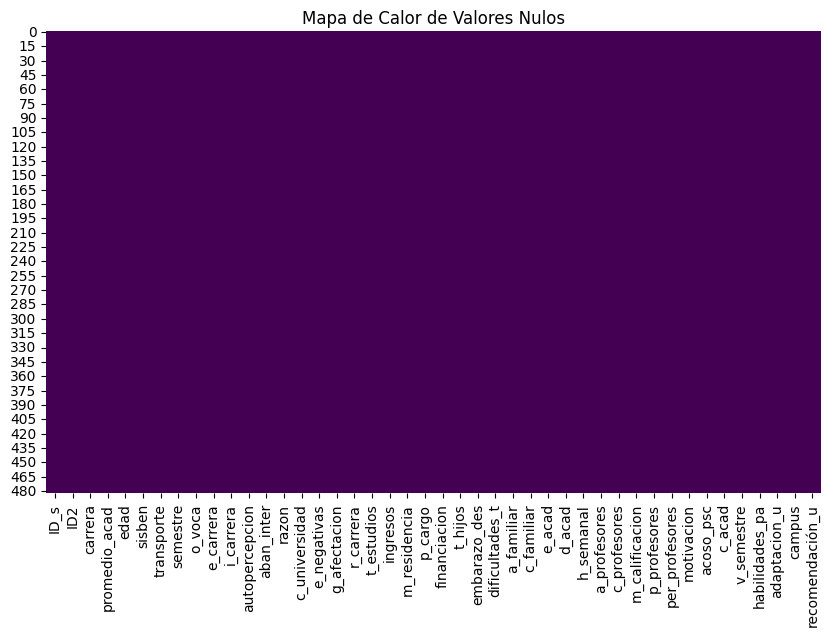

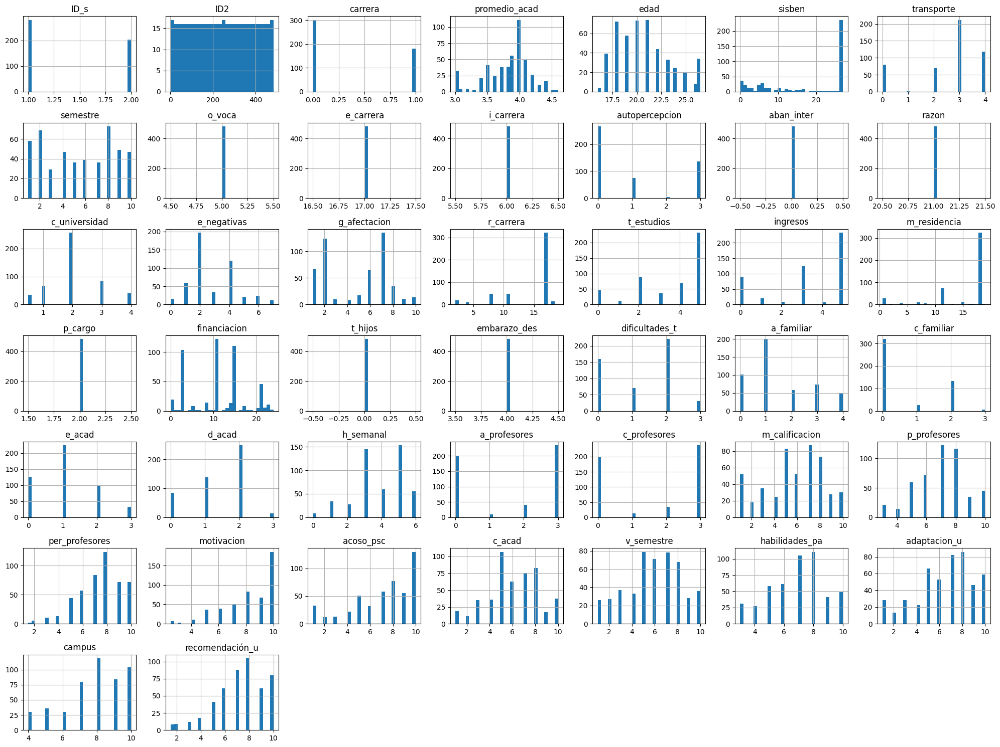

In [ ]:
# Exploración de datos
print("Descripción de los datos:\n", datos.describe())
print("\nInformación de los datos:\n")
datos.info()

# Visualización de valores nulos
plt.figure(figsize=(10, 6))
sns.heatmap(datos.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de Calor de Valores Nulos')
plt.show()

# Histograma de variables
datos.hist(bins=30, figsize=(20, 15), layout=(7, 7))
plt.tight_layout()
plt.show()


Descripción de los datos después de eliminar outliers:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819876   20.806418   
std      0.494117  139.574353    0.484558       0.350309    2.739238   
min      1.000000    1.000000    0.000000       3.000000   14.500000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   26.500000   

           sisben  transporte    semestre  o_voca  e_carrera  ...  \
count  483.000000  483.000000  483.000000   483.0      483.0  ...   
mean    17.080745    2.789855    5.449275     5.0       17.0  ...   
std     10.840589    1.304254    3.025996     0.0        0.0  ...   
min      0.000000  

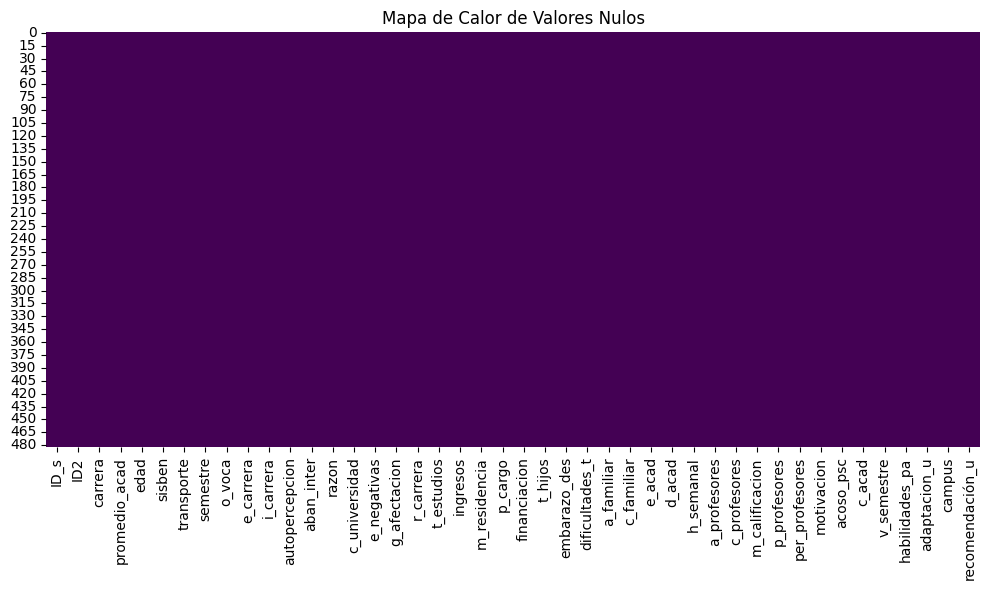

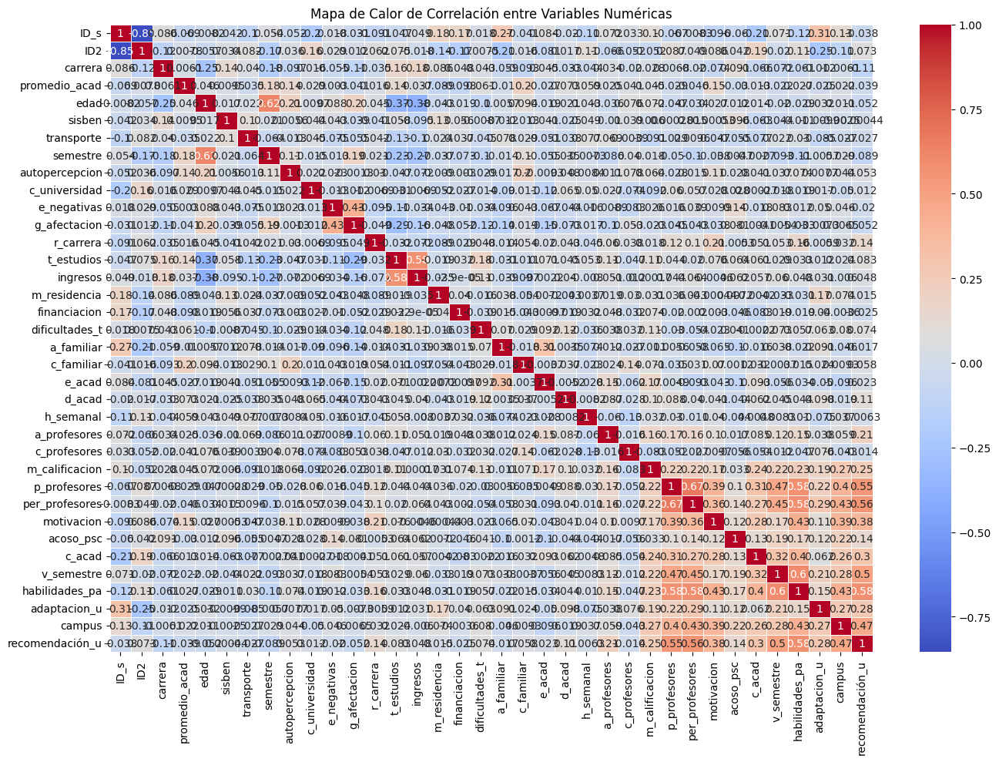

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has be

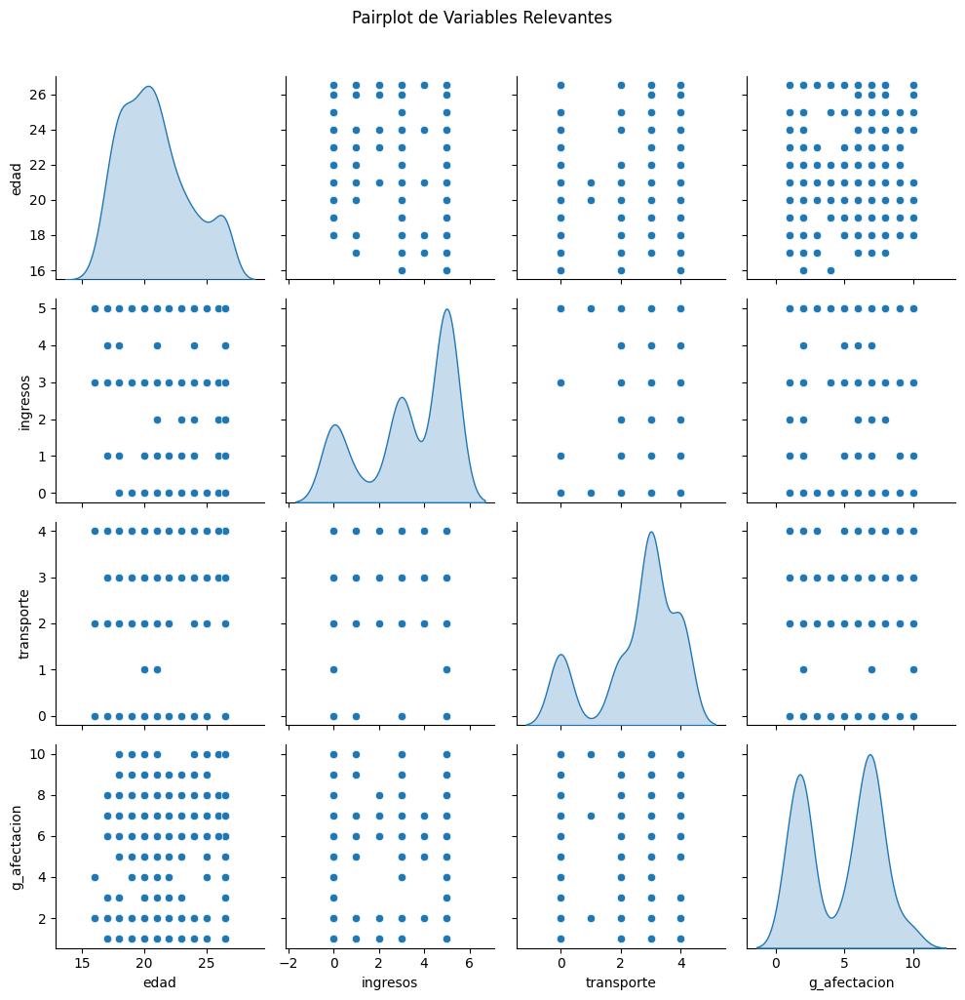

<Figure size 800x600 with 0 Axes>

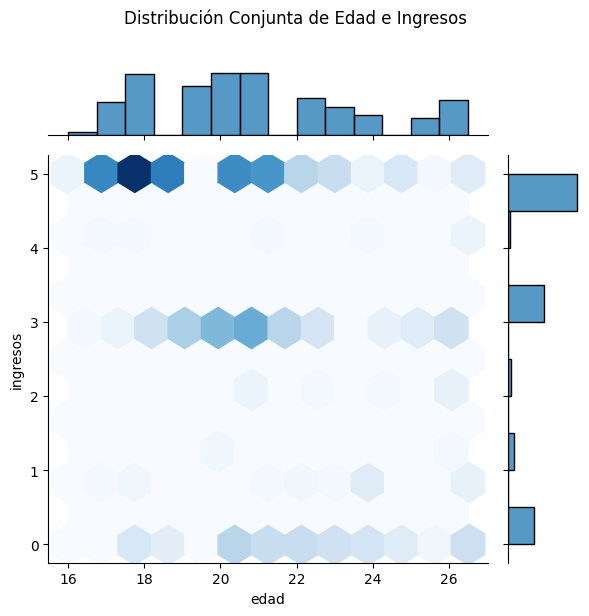

<ipython-input-2-f6ac92e37c30>:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='transporte', y='ingresos', data=datos_sin_outliers, palette='Set2')


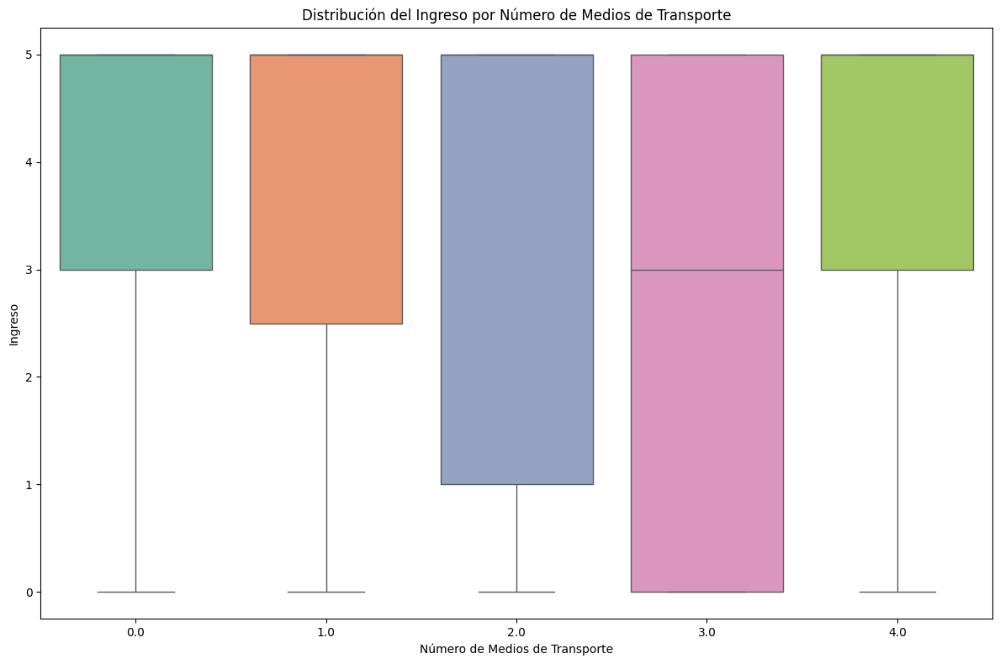

<ipython-input-2-f6ac92e37c30>:106: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='transporte', y='edad', data=datos_sin_outliers, palette='muted', split=True)


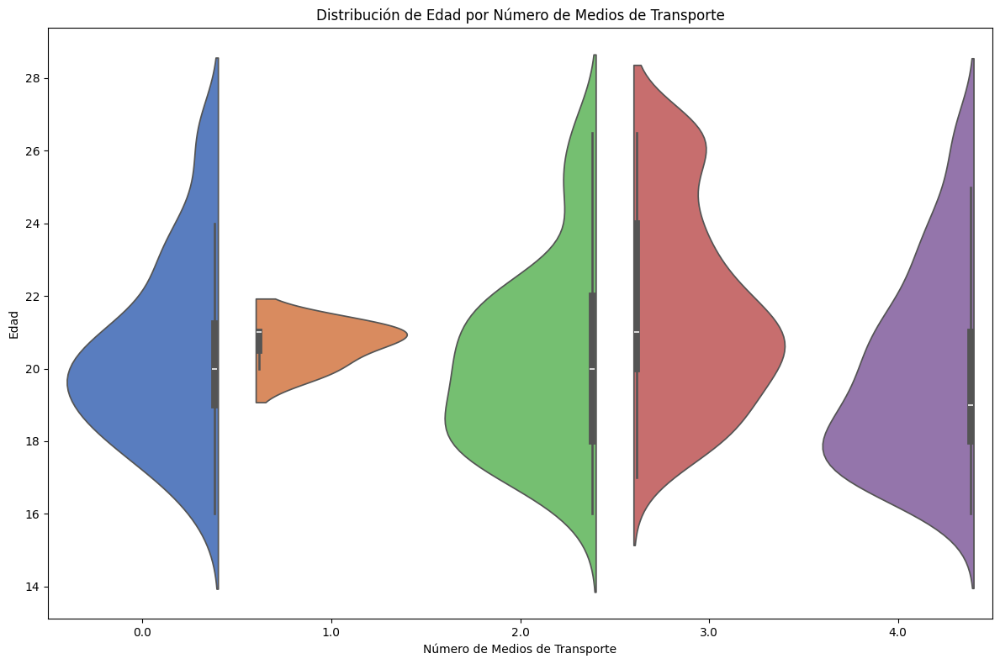

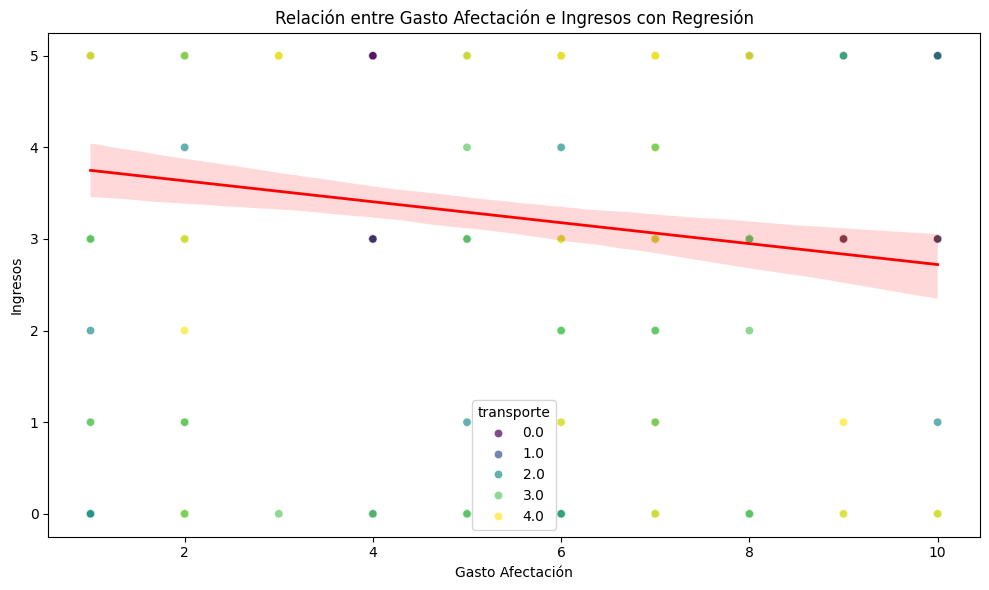

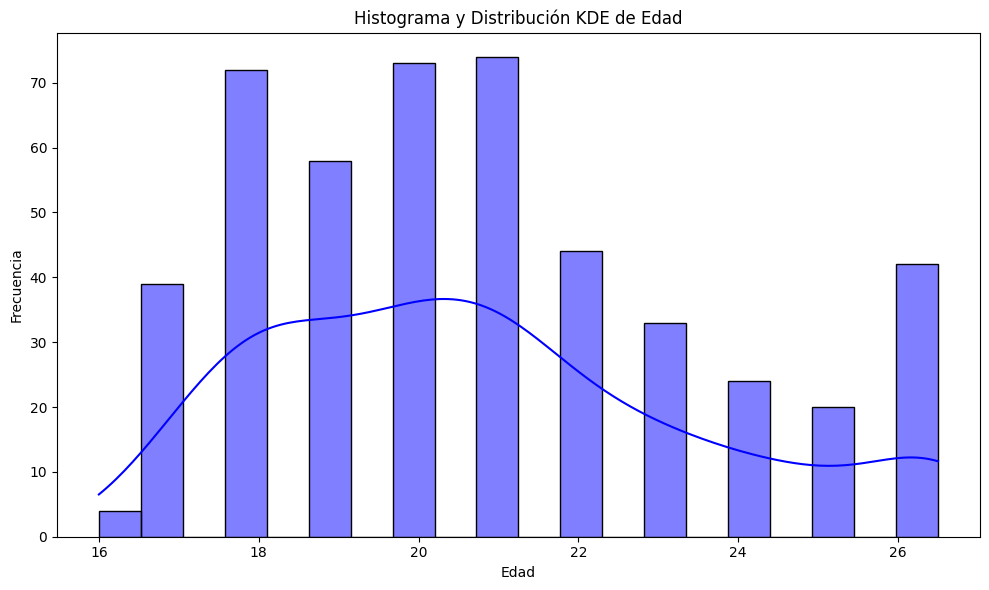

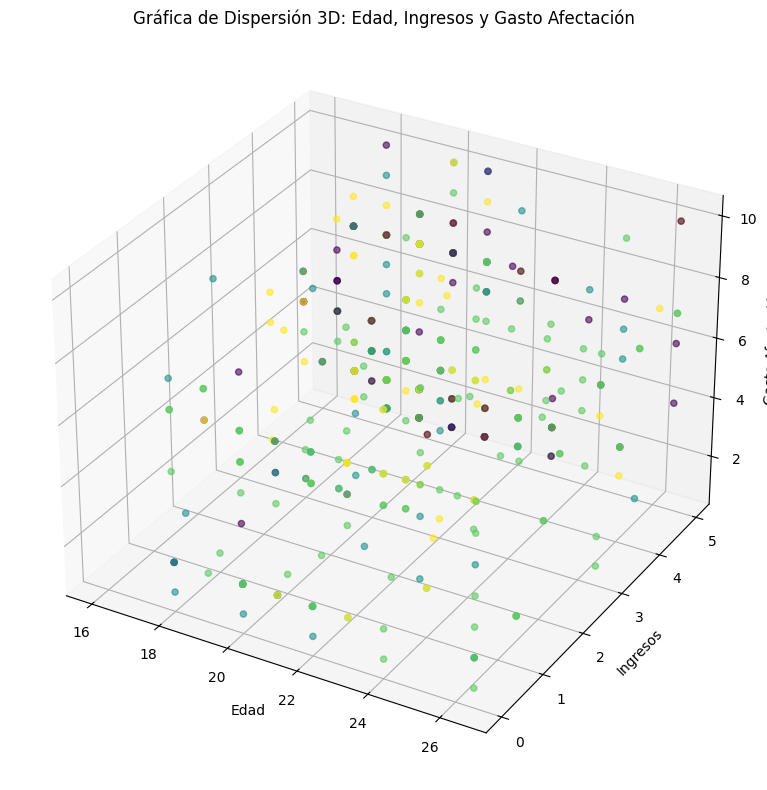

In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Manejo de desequilibrios
from imblearn.over_sampling import SMOTE

# Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import RocCurveDisplay

# Carga de datos
datos = pd.read_excel('DF_final_numerico.xlsx')

# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        df[columna] = df[columna].clip(lower=limite_inferior, upper=limite_superior)
    return df

# Selección de columnas numéricas (excepto ID o identificadores, si no son relevantes)
columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]

# Aplicación de la función para eliminar outliers
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Visualización de los datos después de la corrección de outliers
print("Descripción de los datos después de eliminar outliers:\n", datos_sin_outliers.describe())

# Establecer un mínimo en la edad y redondear transporte
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()

# Eliminación de columnas con valores constantes
columnas_constantes = [col for col in datos_sin_outliers.columns if datos_sin_outliers[col].std() == 0]
datos_sin_outliers = datos_sin_outliers.drop(columns=columnas_constantes)

# Visualización de las columnas eliminadas
print("Columnas eliminadas por ser constantes:", columnas_constantes)

# Visualización final de la descripción de datos ajustada
print("Descripción de los datos después de ajustes adicionales:\n", datos_sin_outliers.describe())

# Exploración de datos
print("Descripción de los datos:\n", datos.describe())
print("\nInformación de los datos:\n")
datos.info()

# Visualización de valores nulos
plt.figure(figsize=(10, 6))
sns.heatmap(datos.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de Calor de Valores Nulos')
plt.tight_layout()
plt.show()

# Gráficos avanzados para el análisis exploratorio de los datos
# 1. Gráfica de correlación con mapa de calor para todas las variables numéricas
plt.figure(figsize=(14, 10))
corr_matrix = datos_sin_outliers.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, linecolor='white')
plt.title('Mapa de Calor de Correlación entre Variables Numéricas')
plt.tight_layout()
plt.show()

# 2. Pares de gráficas (pairplot) para las variables más relevantes
variables_importantes = ['edad', 'ingresos', 'transporte', 'g_afectacion']  # Ejemplo de variables relevantes
sns.pairplot(datos_sin_outliers[variables_importantes], diag_kind='kde', palette='husl')
plt.suptitle('Pairplot de Variables Relevantes', y=1.02)
plt.tight_layout()
plt.show()

# 3. Gráfica de distribución conjunta (jointplot) para explorar la relación entre dos variables
plt.figure(figsize=(8, 6))
sns.jointplot(x='edad', y='ingresos', data=datos_sin_outliers, kind='hex', cmap='Blues')
plt.suptitle('Distribución Conjunta de Edad e Ingresos', y=1.02)
plt.tight_layout()
plt.show()

# 4. Gráfica de cajas (boxplot) para comparar distribución de variables categóricas con numéricas
plt.figure(figsize=(12, 8))
sns.boxplot(x='transporte', y='ingresos', data=datos_sin_outliers, palette='Set2')
plt.title('Distribución del Ingreso por Número de Medios de Transporte')
plt.xlabel('Número de Medios de Transporte')
plt.ylabel('Ingreso')
plt.tight_layout()
plt.show()

# 5. Gráfica de violín (violinplot) para analizar la distribución de la edad según la categoría de transporte
plt.figure(figsize=(12, 8))
sns.violinplot(x='transporte', y='edad', data=datos_sin_outliers, palette='muted', split=True)
plt.title('Distribución de Edad por Número de Medios de Transporte')
plt.xlabel('Número de Medios de Transporte')
plt.ylabel('Edad')
plt.tight_layout()
plt.show()

# 6. Gráfica de dispersión (scatterplot) con tendencia de regresión para dos variables
plt.figure(figsize=(10, 6))
sns.scatterplot(x='g_afectacion', y='ingresos', data=datos_sin_outliers, hue='transporte', palette='viridis', alpha=0.7)
sns.regplot(x='g_afectacion', y='ingresos', data=datos_sin_outliers, scatter=False, color='red', line_kws={'linewidth': 2})
plt.title('Relación entre Gasto Afectación e Ingresos con Regresión')
plt.xlabel('Gasto Afectación')
plt.ylabel('Ingresos')
plt.tight_layout()
plt.show()

# 7. Histograma con distribución de Kernel (KDE) para visualizar la distribución de una variable
plt.figure(figsize=(10, 6))
sns.histplot(datos_sin_outliers['edad'], kde=True, color='blue', bins=20)
plt.title('Histograma y Distribución KDE de Edad')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.tight_layout()
plt.show()

# 8. Gráfica de dispersión 3D para visualizar tres variables
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(datos_sin_outliers['edad'], datos_sin_outliers['ingresos'], datos_sin_outliers['g_afectacion'],
           c=datos_sin_outliers['transporte'], cmap='viridis', alpha=0.6)
ax.set_xlabel('Edad')
ax.set_ylabel('Ingresos')
ax.set_zlabel('Gasto Afectación')
plt.title('Gráfica de Dispersión 3D: Edad, Ingresos y Gasto Afectación')
plt.tight_layout()
plt.show()

# Matriz de confusión avanzada con etiquetas y anotaciones más detalladas
def plot_confusion_matrix(cm, classes, title='Matriz de Confusión', cmap='Blues'):
    plt.figure(figsize=(32, 28))
    sns.heatmap(cm, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
    # plt.figure(figsize=(10, 8))
    # sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=False, linewidths=0.5, linecolor='white',
    #             xticklabels=classes, yticklabels=classes, annot_kws={"size": 14})
    plt.title(title, fontsize=16)
    plt.xlabel('Predicción', fontsize=14)
    plt.ylabel('Real', fontsize=14)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Ejemplo de uso de la matriz de confusión avanzada
# cm = confusion_matrix(y_test, y_pred)  # Supongamos que estos valores ya están definidos
# plot_confusion_matrix(cm, classes=['Baja', 'Media', 'Alta'])


Descripción de los datos después de eliminar outliers:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819876   20.806418   
std      0.494117  139.574353    0.484558       0.350309    2.739238   
min      1.000000    1.000000    0.000000       3.000000   14.500000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   26.500000   

           sisben  transporte    semestre  o_voca  e_carrera  ...  \
count  483.000000  483.000000  483.000000   483.0      483.0  ...   
mean    17.080745    2.789855    5.449275     5.0       17.0  ...   
std     10.840589    1.304254    3.025996     0.0        0.0  ...   
min      0.000000  

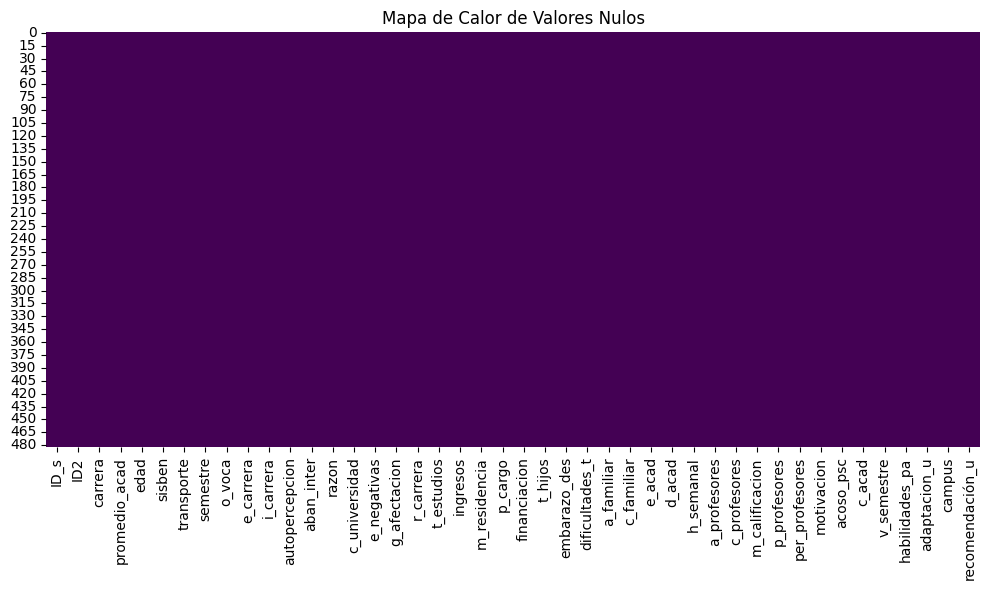

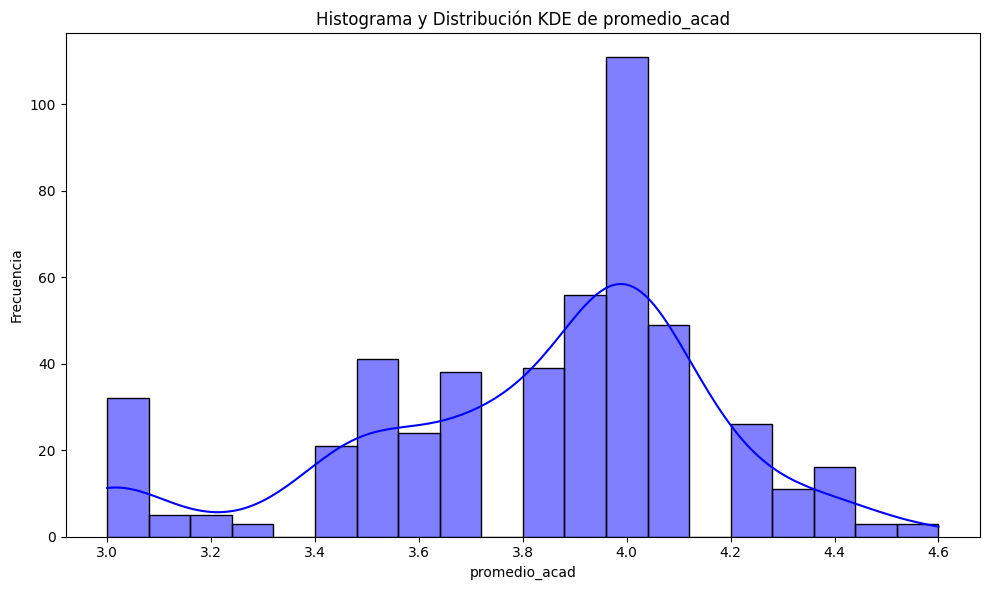

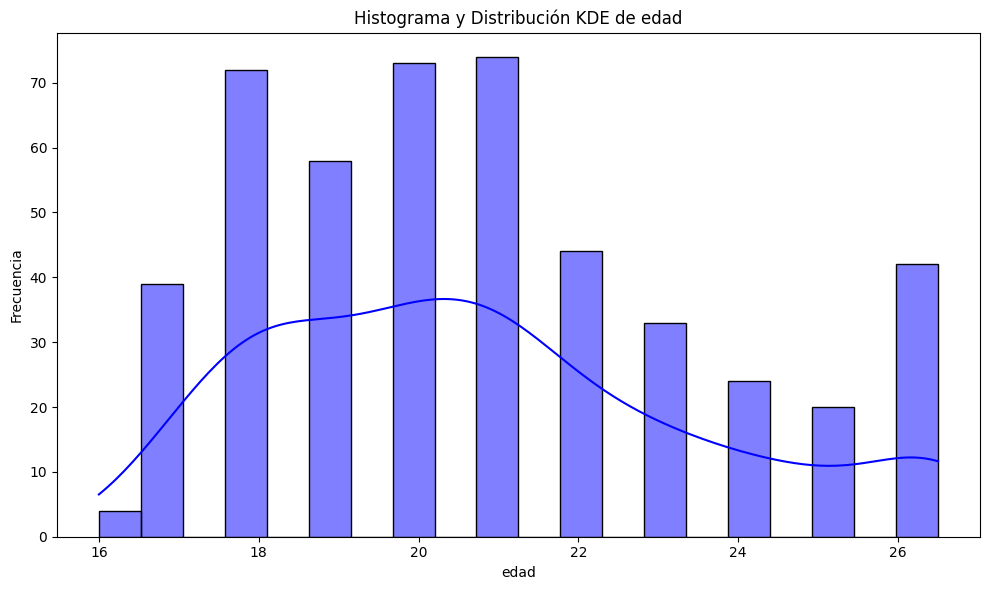

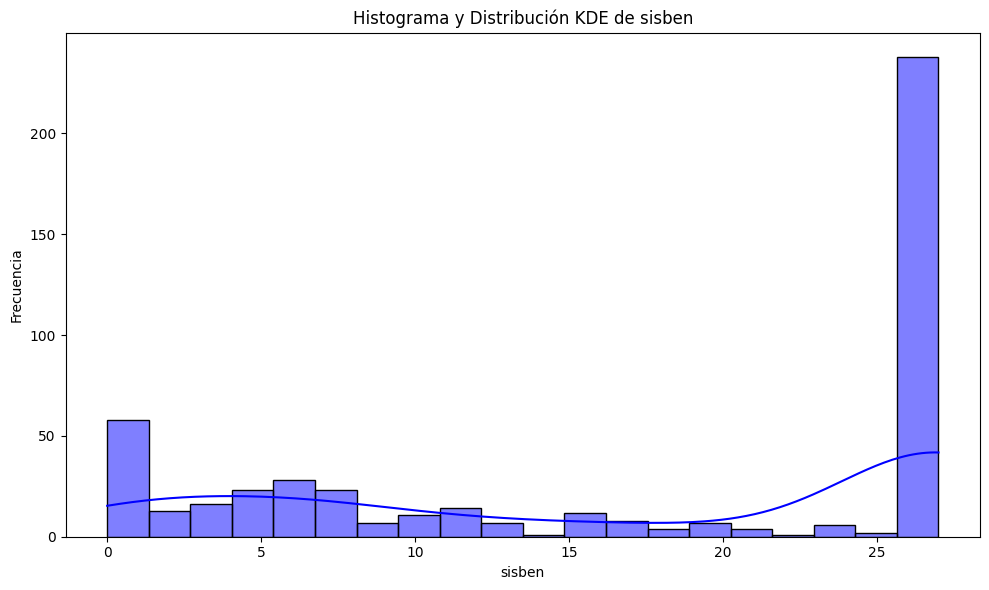

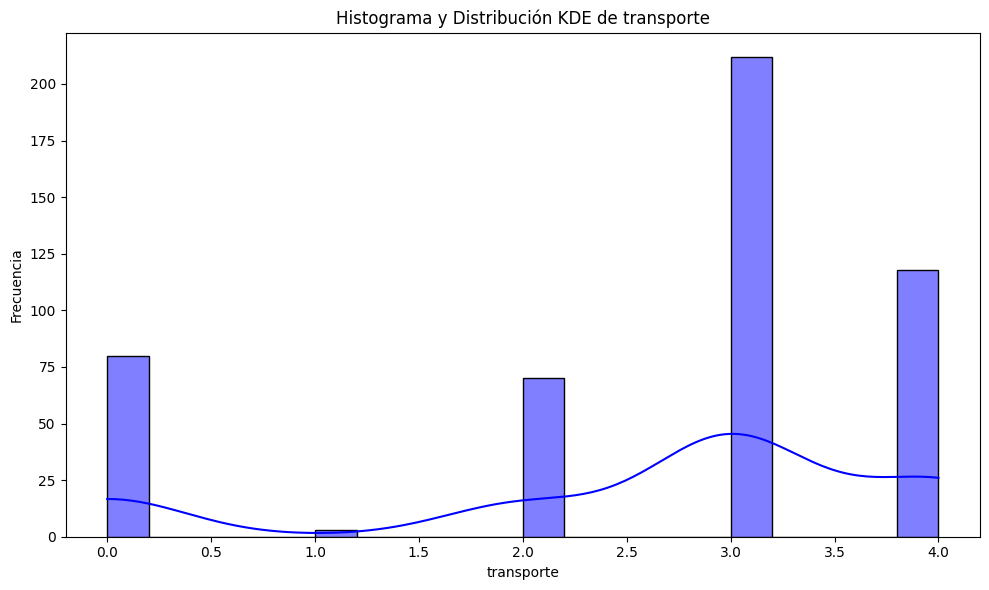

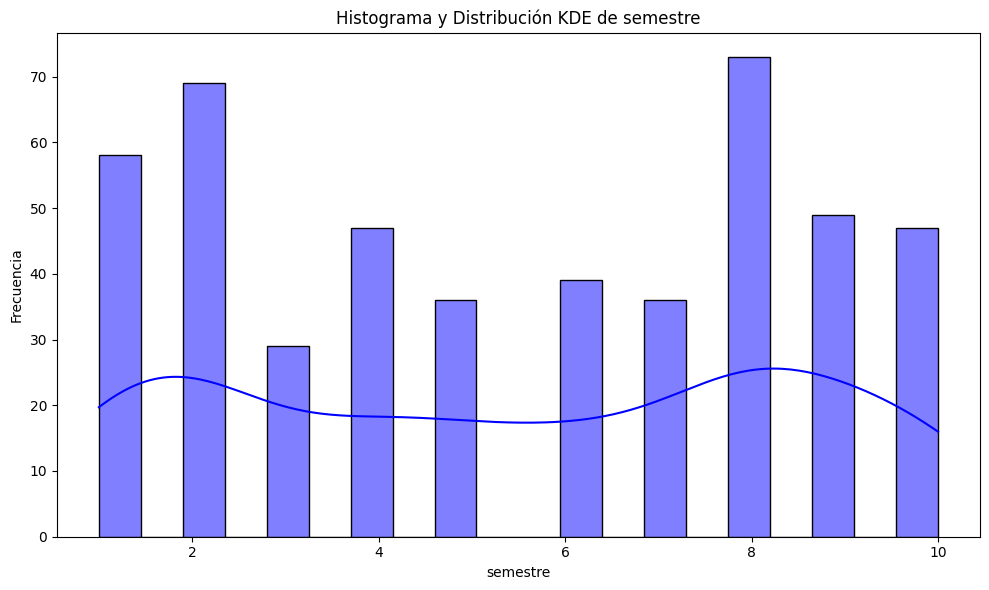

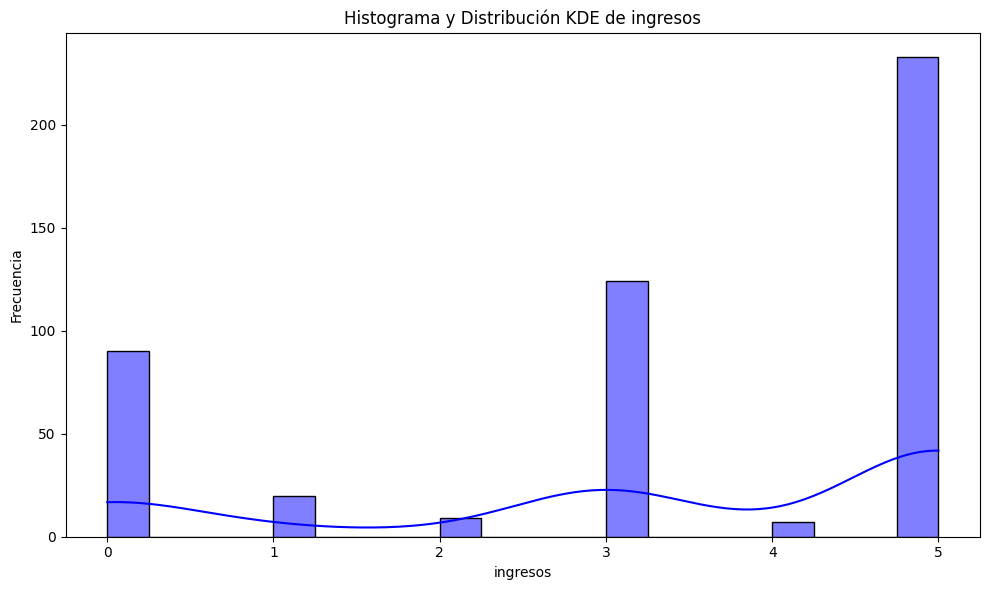

<ipython-input-7-54e75deca90a>:86: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='transporte', y='ingresos', data=datos_sin_outliers, palette='Set2')


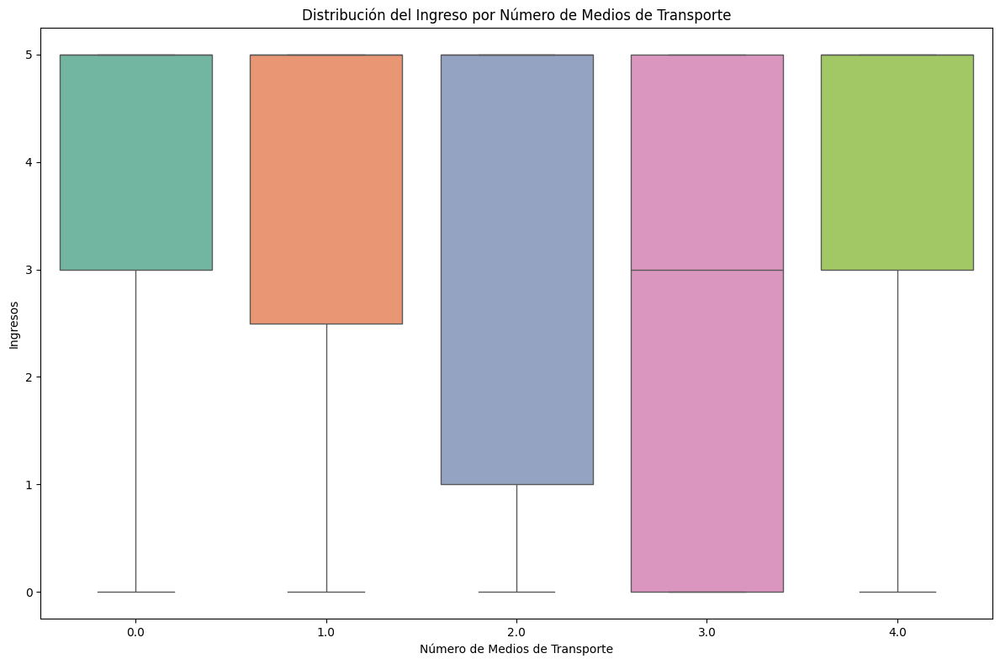

<ipython-input-7-54e75deca90a>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='transporte', y='edad', data=datos_sin_outliers, palette='muted')


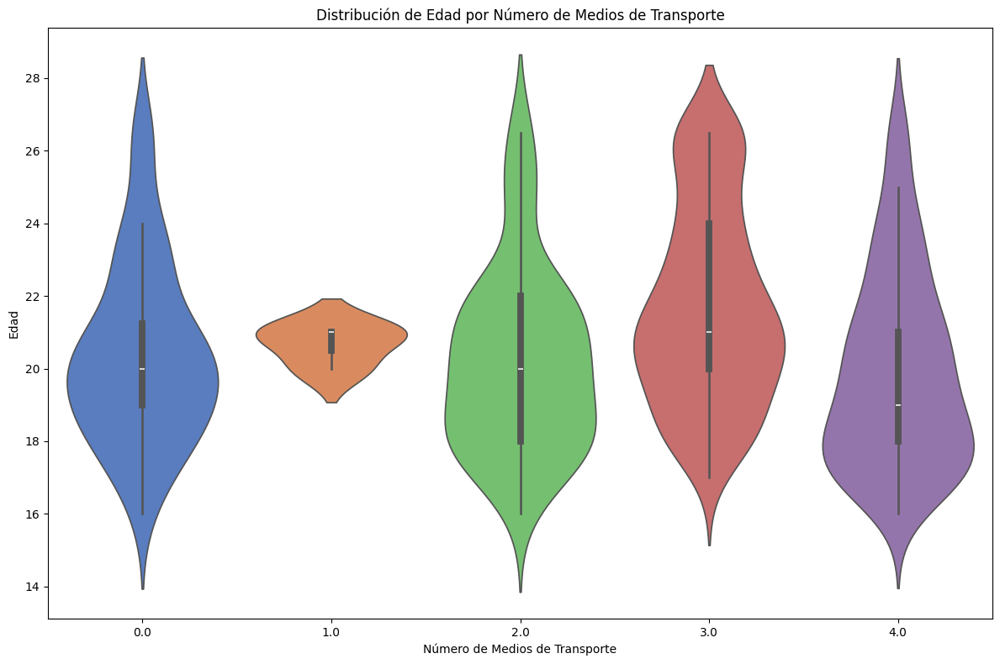

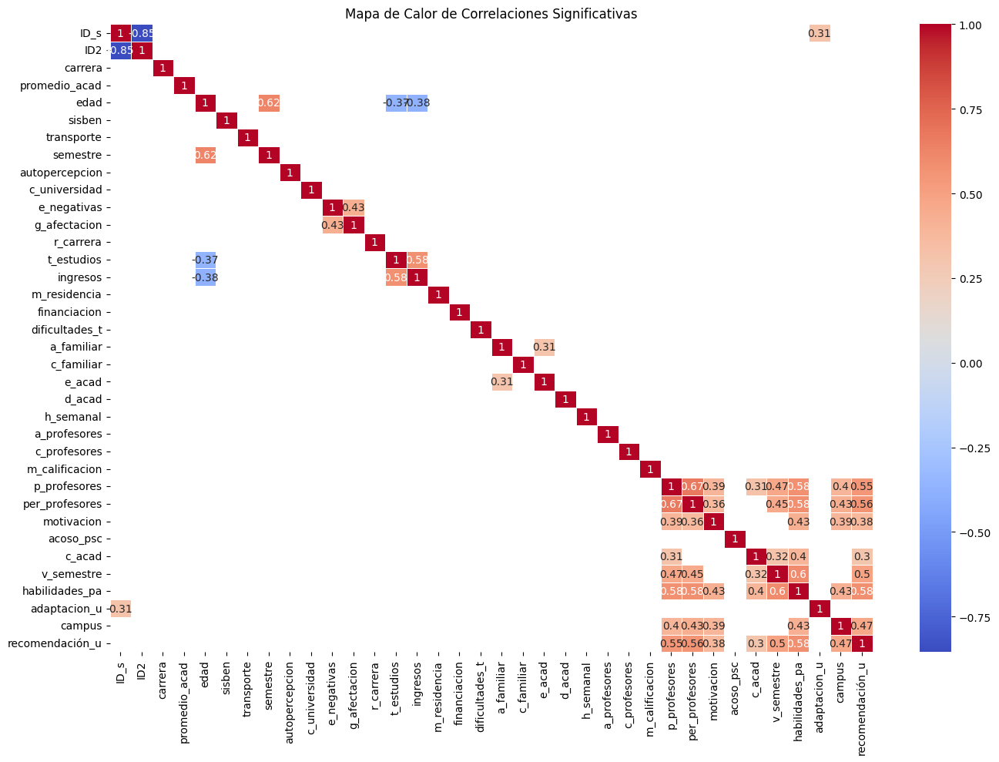

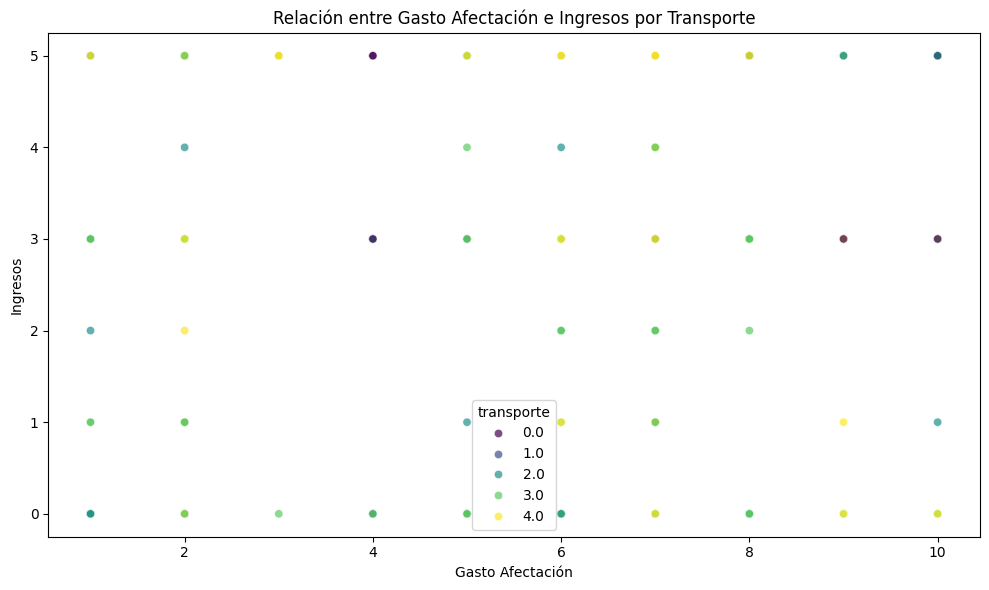

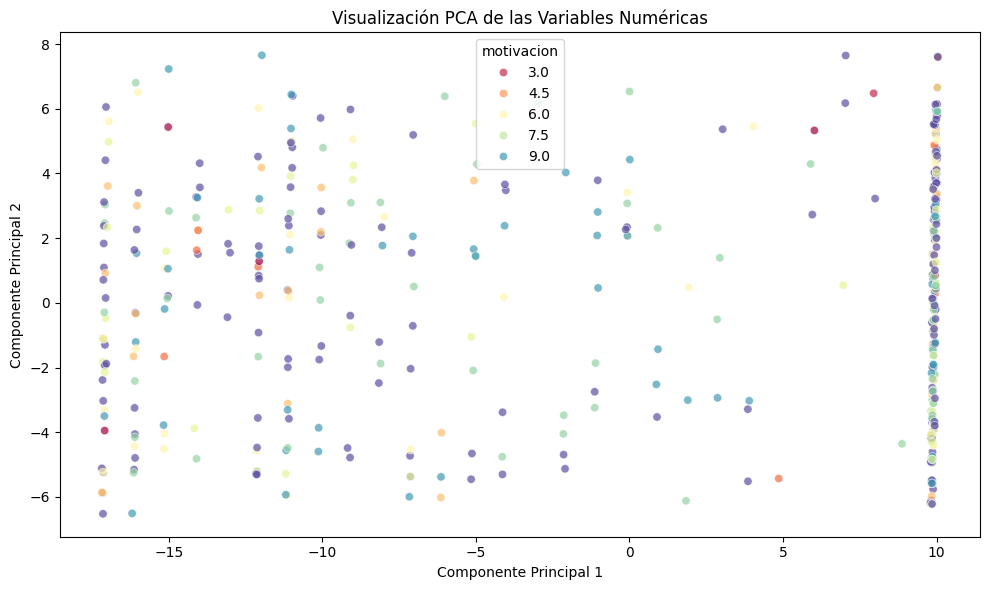

<ipython-input-7-54e75deca90a>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='semestre', y='motivacion', data=datos_sin_outliers, palette='viridis')


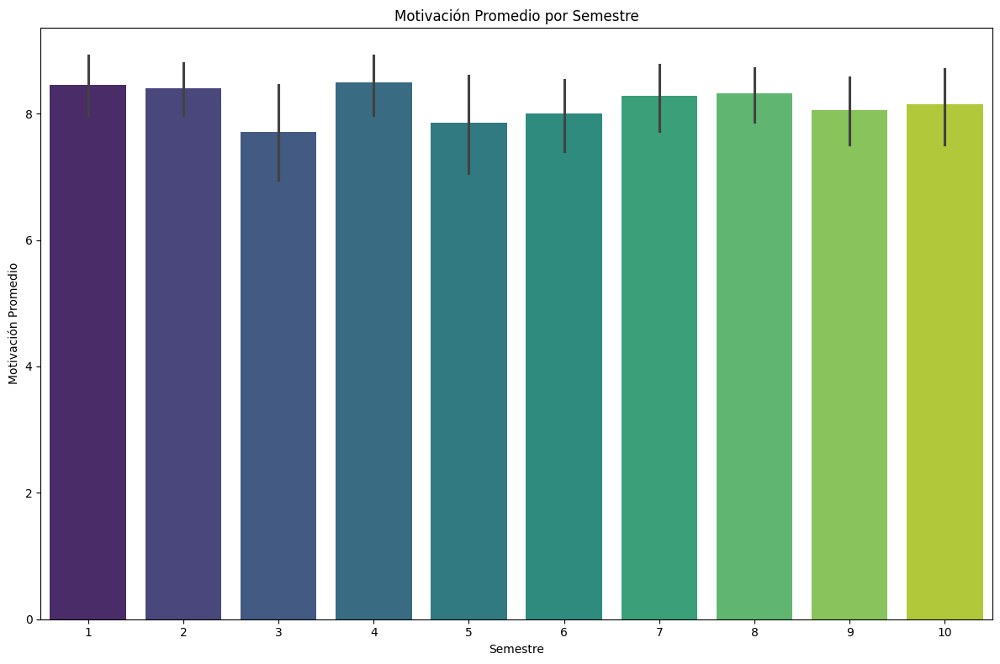

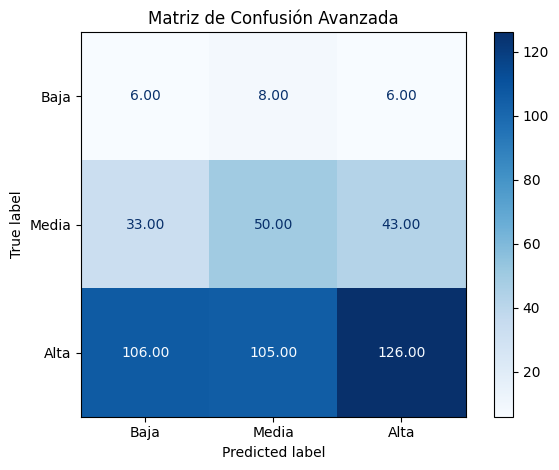

In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Manejo de desequilibrios
from imblearn.over_sampling import SMOTE

# Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import RocCurveDisplay, ConfusionMatrixDisplay

# Carga de datos
datos = pd.read_excel('DF_final_numerico.xlsx')

# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        df[columna] = df[columna].clip(lower=limite_inferior, upper=limite_superior)
    return df

# Selección de columnas numéricas (excepto ID o identificadores, si no son relevantes)
columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]

# Aplicación de la función para eliminar outliers
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Visualización de los datos después de la corrección de outliers
print("Descripción de los datos después de eliminar outliers:\n", datos_sin_outliers.describe())

# Establecer un mínimo en la edad y redondear transporte
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()

# Eliminación de columnas con valores constantes
columnas_constantes = [col for col in datos_sin_outliers.columns if datos_sin_outliers[col].std() == 0]
datos_sin_outliers = datos_sin_outliers.drop(columns=columnas_constantes)

# Visualización de las columnas eliminadas
print("Columnas eliminadas por ser constantes:", columnas_constantes)

# Visualización final de la descripción de datos ajustada
print("Descripción de los datos después de ajustes adicionales:\n", datos_sin_outliers.describe())

# Exploración de datos
print("Descripción de los datos:\n", datos.describe())
print("\nInformación de los datos:\n")
datos.info()

# Visualización de valores nulos
plt.figure(figsize=(10, 6))
sns.heatmap(datos.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de Calor de Valores Nulos')
plt.tight_layout()
plt.show()

# Gráficos avanzados para el análisis exploratorio de los datos
# 1. Histograma y KDE para todas las variables numéricas relevantes
columnas_numericas = ['promedio_acad', 'edad', 'sisben', 'transporte', 'semestre', 'ingresos']
for col in columnas_numericas:
    plt.figure(figsize=(10, 6))
    sns.histplot(datos_sin_outliers[col], kde=True, color='blue', bins=20)
    plt.title(f'Histograma y Distribución KDE de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()

# 2. Relación entre variables categóricas y numéricas usando boxplot y violinplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='transporte', y='ingresos', data=datos_sin_outliers, palette='Set2')
plt.title('Distribución del Ingreso por Número de Medios de Transporte')
plt.xlabel('Número de Medios de Transporte')
plt.ylabel('Ingresos')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.violinplot(x='transporte', y='edad', data=datos_sin_outliers, palette='muted')
plt.title('Distribución de Edad por Número de Medios de Transporte')
plt.xlabel('Número de Medios de Transporte')
plt.ylabel('Edad')
plt.tight_layout()
plt.show()

# 3. Mapa de calor de correlaciones significativas
plt.figure(figsize=(14, 10))
corr_matrix = datos_sin_outliers.corr()
significant_corr_matrix = corr_matrix[(corr_matrix >= 0.3) | (corr_matrix <= -0.3)]
sns.heatmap(significant_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, linecolor='white')
plt.title('Mapa de Calor de Correlaciones Significativas')
plt.tight_layout()
plt.show()

# 4. Gráfica de dispersión mejorada con densidad y hue
plt.figure(figsize=(10, 6))
sns.scatterplot(x='g_afectacion', y='ingresos', data=datos_sin_outliers, hue='transporte', palette='viridis', alpha=0.7)
plt.title('Relación entre Gasto Afectación e Ingresos por Transporte')
plt.xlabel('Gasto Afectación')
plt.ylabel('Ingresos')
plt.tight_layout()
plt.show()

# 5. Análisis de Componentes Principales (PCA)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(datos_sin_outliers[columnas_numericas])
datos_sin_outliers['PCA1'] = pca_result[:, 0]
datos_sin_outliers['PCA2'] = pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', data=datos_sin_outliers, hue='motivacion', palette='Spectral', alpha=0.7)
plt.title('Visualización PCA de las Variables Numéricas')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.tight_layout()
plt.show()

# 6. Comparación de motivación y factores asociados con gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(x='semestre', y='motivacion', data=datos_sin_outliers, palette='viridis')
plt.title('Motivación Promedio por Semestre')
plt.xlabel('Semestre')
plt.ylabel('Motivación Promedio')
plt.tight_layout()
plt.show()

# 7. Matriz de confusión avanzada con etiquetas y anotaciones más detalladas
# Ejemplo de matriz de confusión (asumiendo que ya se tiene el modelo entrenado y las predicciones realizadas)
y_test = np.where(datos_sin_outliers['motivacion'] <= 4, 'Baja', np.where(datos_sin_outliers['motivacion'] <= 7, 'Media', 'Alta'))
y_pred = np.random.choice(['Baja', 'Media', 'Alta'], size=len(y_test))  # Ejemplo de predicciones aleatorias
cm = confusion_matrix(y_test, y_pred, labels=['Baja', 'Media', 'Alta'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Baja', 'Media', 'Alta'])
disp.plot(cmap='Blues', values_format='.2f')
plt.title('Matriz de Confusión Avanzada')
plt.tight_layout()
plt.show()


In [ ]:
datos.columns

Index(['ID_s', 'ID2', 'carrera', 'promedio_acad', 'edad', 'sisben',
       'transporte', 'semestre', 'o_voca', 'e_carrera', 'i_carrera',
       'autopercepcion', 'aban_inter', 'razon', 'c_universidad', 'e_negativas',
       'g_afectacion', 'r_carrera', 't_estudios', 'ingresos', 'm_residencia',
       'p_cargo', 'financiacion', 't_hijos', 'embarazo_des', 'dificultades_t',
       'a_familiar', 'c_familiar', 'e_acad', 'd_acad', 'h_semanal',
       'a_profesores', 'c_profesores', 'm_calificacion', 'p_profesores',
       'per_profesores', 'motivacion', 'acoso_psc', 'c_acad', 'v_semestre',
       'habilidades_pa', 'adaptacion_u', 'campus', 'recomendación_u'],
      dtype='object')

In [ ]:
low_variance_columns = datos_sin_outliers.var()[datos_sin_outliers.var() < 0.1].index.tolist()
print("Columnas con baja varianza:", low_variance_columns)


Columnas con baja varianza: []


In [ ]:
# 1. Selección de correlaciones significativas con respecto a la variable objetivo 'motivacion'
target = 'motivacion'
threshold = 0.5
correlation_matrix = datos.corr()
significant_corr = correlation_matrix[(correlation_matrix >= threshold) | (correlation_matrix <= -threshold)]
print(f"Correlaciones significativas (>|{threshold}|) con respecto a '{target}':")
print(significant_corr[target].dropna())

# 2. Visualización de relaciones relevantes
# Filtrar las variables que tienen una correlación significativa con 'motivacion'
high_corr_vars = significant_corr[target].dropna().index.tolist()
high_corr_vars.remove(target)  # Remover la variable objetivo de la lista

for var in high_corr_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=datos, x=var, y=target, alpha=0.6)
    plt.title(f'Relación entre {target} y {var}')
    plt.xlabel(var)
    plt.ylabel(target)
    plt.show()




Correlaciones significativas (>|0.5|) con respecto a 'motivacion':
motivacion    1.0
Name: motivacion, dtype: float64


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. Separación de la variable objetivo y las variables predictoras
X = datos.drop(columns=['motivacion'])  # Variables predictoras
y = datos['motivacion']  # Variable objetivo

# 2. División de los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 3. Escalado de los datos (es importante para PCA)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicación de PCA para mantener el 95% de la varianza
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Imprimir los resultados
print(f"Dimensionalidad original: {X_train.shape[1]}")
print(f"Dimensionalidad después de PCA: {X_train_pca.shape[1]}")

# Varianza explicada acumulada por los componentes seleccionados
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Varianza explicada por cada componente principal: {explained_variance_ratio}")
print(f"Varianza acumulada: {explained_variance_ratio.cumsum()}")


Dimensionalidad original: 43
Dimensionalidad después de PCA: 29
Varianza explicada por cada componente principal: [0.1211423  0.07798746 0.07363321 0.05243737 0.04720784 0.03854274
 0.03784786 0.03606097 0.03255918 0.03139324 0.03049288 0.02961636
 0.02832987 0.02705009 0.02666224 0.02557732 0.02482207 0.02295604
 0.02248219 0.02136165 0.02099614 0.01951909 0.01904393 0.01730689
 0.01596512 0.01519557 0.0147078  0.01268577 0.01127159]
Varianza acumulada: [0.1211423  0.19912977 0.27276298 0.32520034 0.37240818 0.41095092
 0.44879878 0.48485975 0.51741893 0.54881218 0.57930506 0.60892142
 0.63725129 0.66430138 0.69096362 0.71654094 0.74136301 0.76431905
 0.78680123 0.80816288 0.82915902 0.84867812 0.86772205 0.88502894
 0.90099406 0.91618963 0.93089743 0.9435832  0.9548548 ]


In [ ]:
# Verificación de valores nulos
print("\nValores nulos en cada columna:\n", datos.isnull().sum())

# Tratamiento de valores nulos
datos.fillna(datos.mean(), inplace=True)

# Si hay variables categóricas, aplicamos codificación
# datos = pd.get_dummies(datos, drop_first=True)



Valores nulos en cada columna:
 ID_s               0
ID2                0
carrera            0
promedio_acad      0
edad               0
sisben             0
transporte         0
semestre           0
o_voca             0
e_carrera          0
i_carrera          0
autopercepcion     0
aban_inter         0
razon              0
c_universidad      0
e_negativas        0
g_afectacion       0
r_carrera          0
t_estudios         0
ingresos           0
m_residencia       0
p_cargo            0
financiacion       0
t_hijos            0
embarazo_des       0
dificultades_t     0
a_familiar         0
c_familiar         0
e_acad             0
d_acad             0
h_semanal          0
a_profesores       0
c_profesores       0
m_calificacion     0
p_profesores       0
per_profesores     0
motivacion         0
acoso_psc          0
c_acad             0
v_semestre         0
habilidades_pa     0
adaptacion_u       0
campus             0
recomendación_u    0
dtype: int64


In [ ]:
# Separación de variables
X = datos.drop(columns=['motivacion'])
y = datos['motivacion']

# Verificación de desequilibrio de clases
print("\nDistribución de clases en la variable objetivo:\n", y.value_counts())


Distribución de clases en la variable objetivo:
 motivacion
10.0    186
8.0      83
9.0      68
7.0      50
6.0      39
5.0      37
4.0      10
2.5       7
3.0       3
Name: count, dtype: int64


In [ ]:
# División del conjunto de datos
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)

In [ ]:
# Escalado de características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Reclasificación de la variable objetivo
def reclasificar_motivacion(motivacion):
    if motivacion <= 4:
        return 'Baja'
    elif 5 <= motivacion <= 7:
        return 'Media'
    else:
        return 'Alta'

y_train_reclas = y_train.map(reclasificar_motivacion)
y_test_reclas = y_test.map(reclasificar_motivacion)

# Verificar la nueva distribución de clases
print("\nDistribución de clases después de la reclasificación (entrenamiento):\n", y_train_reclas.value_counts())


Distribución de clases después de la reclasificación (entrenamiento):
 motivacion
Alta     236
Media     88
Baja      14
Name: count, dtype: int64


In [ ]:
# Balanceo con SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_scaled, y_train_reclas)

# Verificar la nueva distribución
print("\nDistribución de clases después del balanceo:\n", pd.Series(y_train_bal).value_counts())


Distribución de clases después del balanceo:
 motivacion
Alta     236
Media    236
Baja     236
Name: count, dtype: int64


<ipython-input-57-c3100e500212>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train_reclas, ax=axes[0], palette='viridis')
<ipython-input-57-c3100e500212>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train_bal, ax=axes[1], palette='viridis')


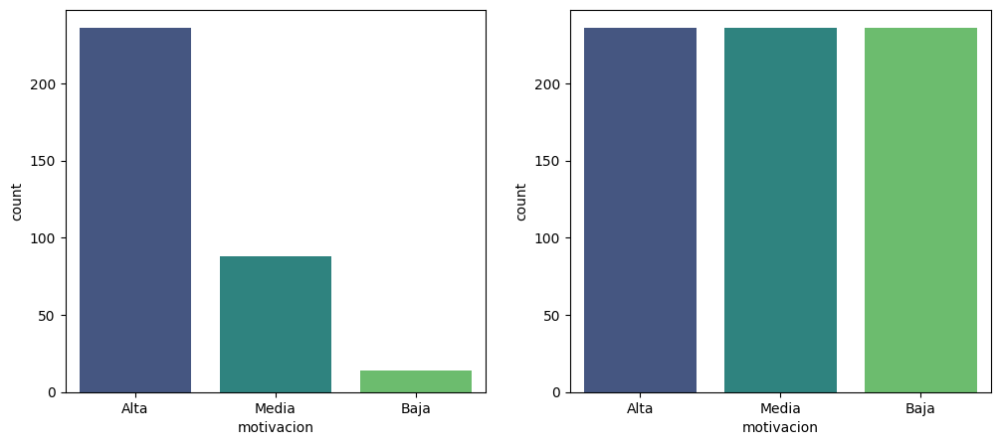

In [ ]:
# Visualización antes y después del balanceo
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.countplot(x=y_train_reclas, ax=axes[0], palette='viridis')
sns.countplot(x=y_train_bal, ax=axes[1], palette='viridis')
plt.show()

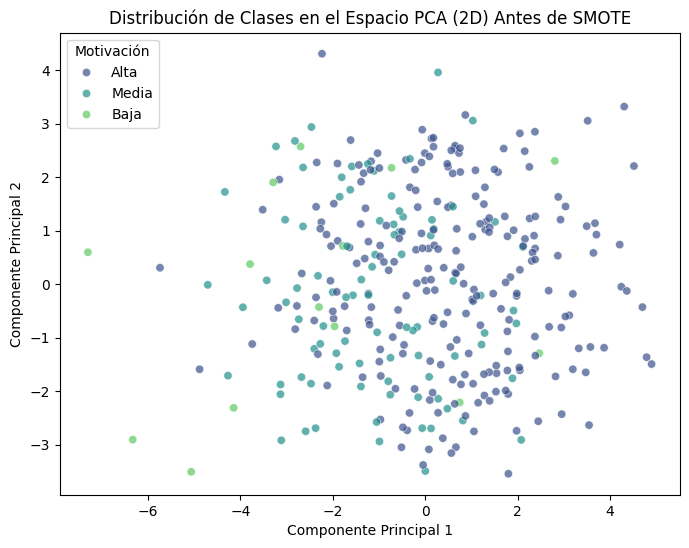

In [ ]:
# PCA para visualización en 2D antes de SMOTE
pca_before = PCA(n_components=2)
X_pca_before = pca_before.fit_transform(X_train_scaled)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca_before[:,0], y=X_pca_before[:,1], hue=y_train_reclas, palette='viridis', alpha=0.7)
plt.title("Distribución de Clases en el Espacio PCA (2D) Antes de SMOTE")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title='Motivación')
plt.show()

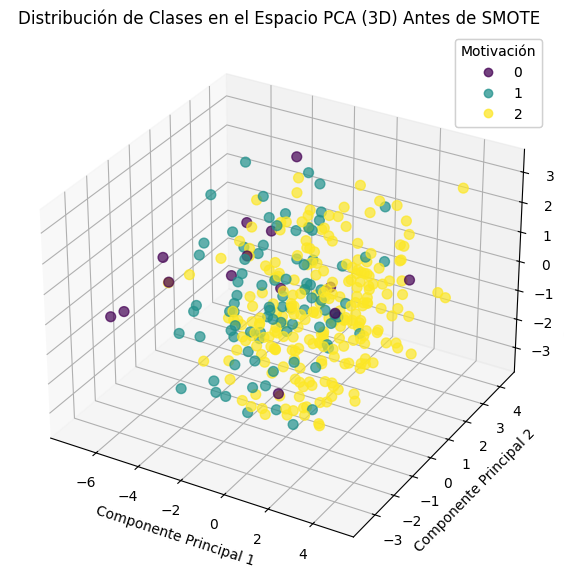

In [ ]:
# PCA para visualización en 3D antes de SMOTE
pca_3d_before = PCA(n_components=3)
X_pca_3d_before = pca_3d_before.fit_transform(X_train_scaled)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d_before[:,0], X_pca_3d_before[:,1], X_pca_3d_before[:,2],
    c=y_train_reclas.map({'Baja':0, 'Media':1, 'Alta':2}),
    cmap='viridis', s=50, alpha=0.7
)
ax.set_title("Distribución de Clases en el Espacio PCA (3D) Antes de SMOTE")
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")
legend1 = ax.legend(*scatter.legend_elements(), title="Motivación")
ax.add_artist(legend1)
plt.show()


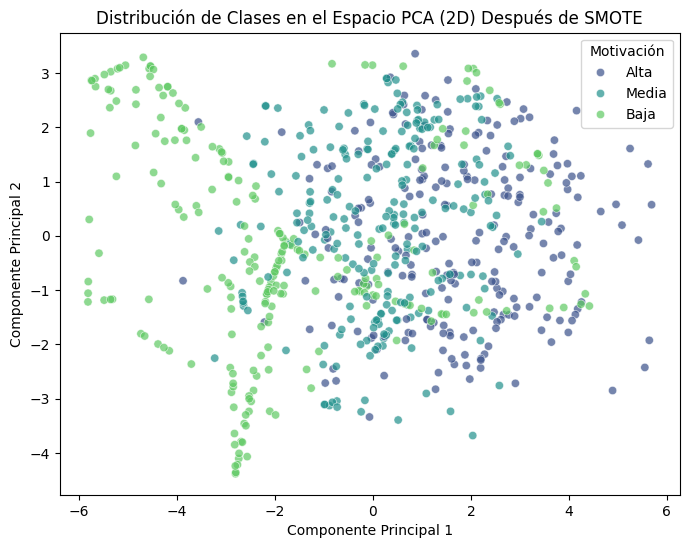

In [ ]:
# PCA para visualización en 2D después de SMOTE
pca_after = PCA(n_components=2)
X_pca_after = pca_after.fit_transform(X_train_bal)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca_after[:,0], y=X_pca_after[:,1], hue=y_train_bal, palette='viridis', alpha=0.7)
plt.title("Distribución de Clases en el Espacio PCA (2D) Después de SMOTE")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title='Motivación')
plt.show()


In [ ]:
# GridSearch para KNN
knn = KNeighborsClassifier()
param_knn = {
    'n_neighbors': range(1, 21),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev']
}

grid_knn = GridSearchCV(knn, param_knn, cv=5, scoring='f1_macro', n_jobs=-1)
grid_knn.fit(X_train_bal, y_train_bal)

# Mejores parámetros y rendimiento
print("Mejores parámetros para KNN:", grid_knn.best_params_)

Mejores parámetros para KNN: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [0.81565947 0.81565947 0.84999062 0.81565947 0.78808567 0.7932564
 0.79604247 0.79053385 0.76015229 0.76406187 0.76233292 0.76134766
 0.74101225 0.75009041 0.750312   0.7596515  0.72383729 0.74552831
 0.72910877 0.74456589 0.70989921 0.73503336 0.70847307 0.73652835
 0.69395995 0.71839059 0.6946628  0.71778923 0.70008925 0.72025756
 0.68284468 0.70878343 0.68081525 0.70150707 0.68685939 0.71200407
 0.67950526 0.7017648  0.66921753 0.69744526        nan 0.8930129
        nan 0.8930129         nan 0.87938074        nan 0.88376834
        nan 0.86564227        nan 0.86597498        nan 0.84677014
        nan 0.86231193        nan 0.85572985        nan 0.85430008
        nan 0.84930513        nan 0.85130423        nan 0.84307533
        nan 0.84496466        nan 0.84136142        nan 0.84755822
        nan 0.83211191        nan 0.83780543        nan 0

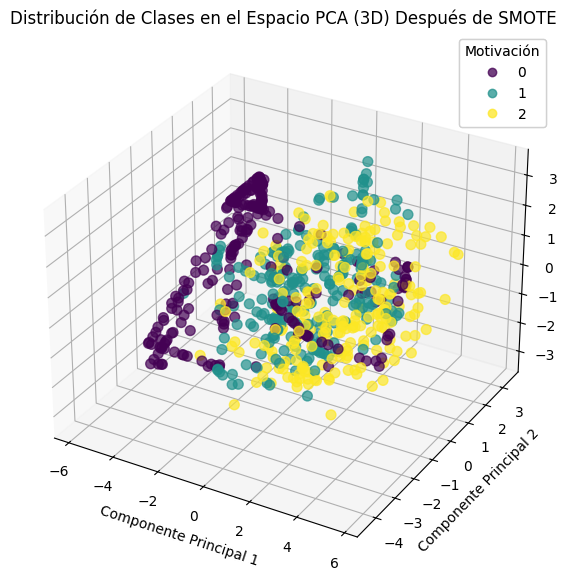

In [ ]:
# PCA para visualización en 3D después de SMOTE
pca_3d_after = PCA(n_components=3)
X_pca_3d_after = pca_3d_after.fit_transform(X_train_bal)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d_after[:,0], X_pca_3d_after[:,1], X_pca_3d_after[:,2],
    c=y_train_bal.map({'Baja':0, 'Media':1, 'Alta':2}),
    cmap='viridis', s=50, alpha=0.7
)
ax.set_title("Distribución de Clases en el Espacio PCA (3D) Después de SMOTE")
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")
legend1 = ax.legend(*scatter.legend_elements(), title="Motivación")
ax.add_artist(legend1)
plt.show()


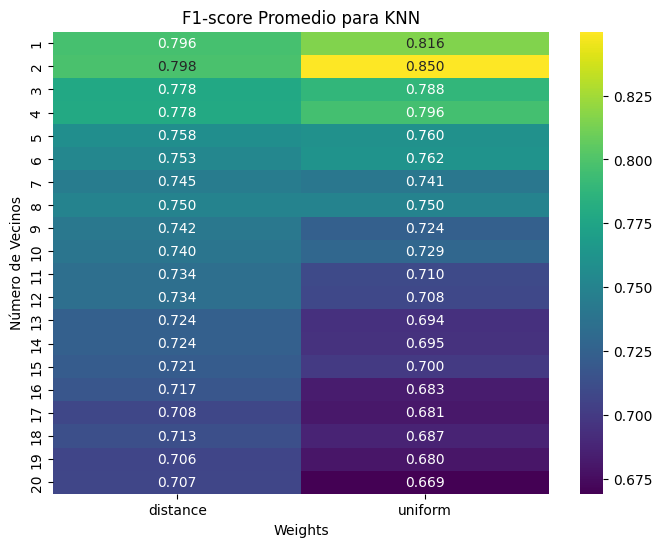

In [ ]:
# Extraer resultados de GridSearchCV para KNN
results_knn = pd.DataFrame(grid_knn.cv_results_)

# Pivot table para visualizar
pivot_knn = results_knn.pivot_table(
    index='param_n_neighbors',
    columns='param_weights',
    values='mean_test_score'
)

# Heatmap de F1-score promedio para diferentes hiperparámetros de KNN
plt.figure(figsize=(8,6))
sns.heatmap(pivot_knn, annot=True, fmt=".3f", cmap='viridis')
plt.title('F1-score Promedio para KNN')
plt.xlabel('Weights')
plt.ylabel('Número de Vecinos')
plt.show()


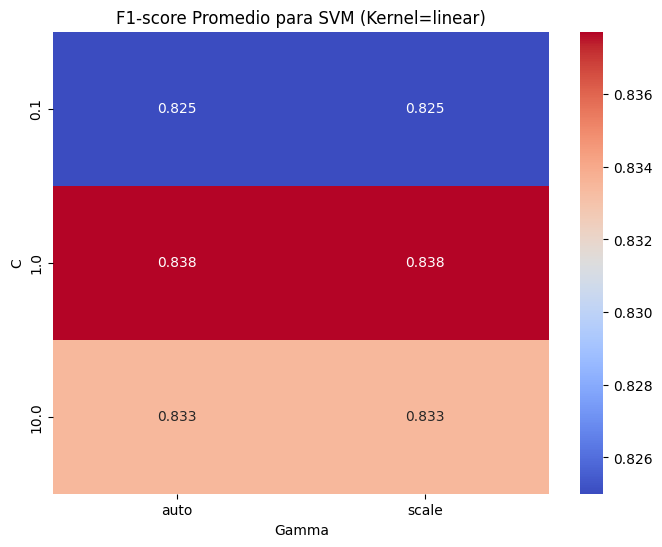

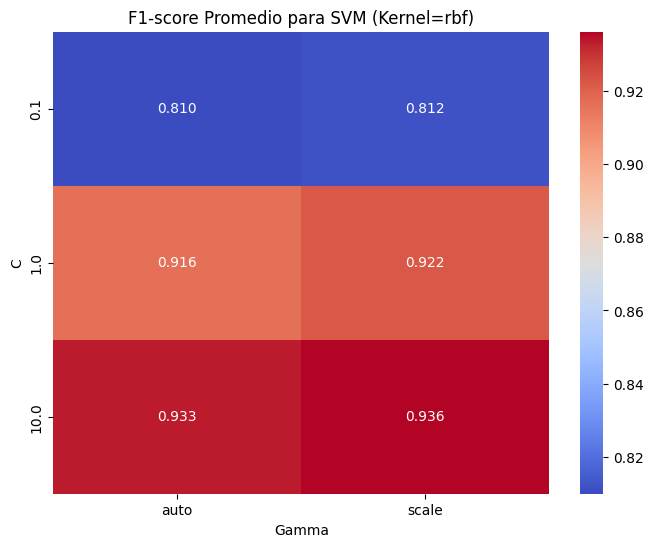

In [ ]:
# Extraer resultados de GridSearchCV para SVM
results_svm = pd.DataFrame(grid_svm.cv_results_)

# Filtrar por kernel para visualizar
for kernel in grid_svm.param_grid['kernel']:
    subset = results_svm[results_svm['param_kernel'] == kernel]
    pivot_svm = subset.pivot_table(
        index='param_C',
        columns='param_gamma',
        values='mean_test_score'
    )
    plt.figure(figsize=(8,6))
    sns.heatmap(pivot_svm, annot=True, fmt=".3f", cmap='coolwarm')
    plt.title(f'F1-score Promedio para SVM (Kernel={kernel})')
    plt.xlabel('Gamma')
    plt.ylabel('C')
    plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


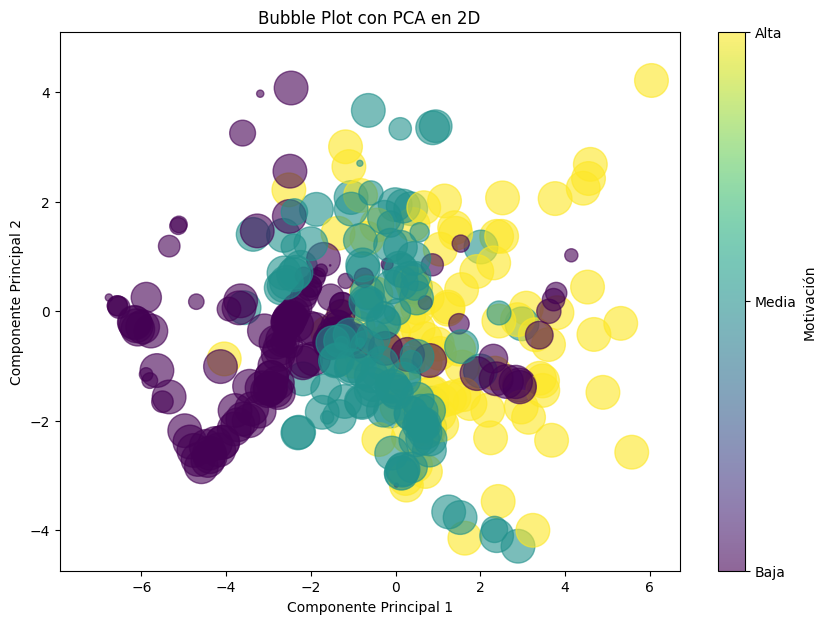

In [ ]:
# Asumimos que tenemos una característica adicional para el tamaño (por ejemplo, edad)
# Si no la tenemos, podemos usar una variable aleatoria o alguna característica existente

# Supongamos que tenemos una característica 'edad' en X_train_bal
# Si no existe, puedes reemplazar 'edad' con alguna otra variable numérica
edad = X_train_bal[:, 0]  # Usamos la primera característica como ejemplo

# Bubble plot en 2D
plt.figure(figsize=(10,7))
plt.scatter(
    X_pca_after[:, 0], X_pca_after[:, 1],
    s=edad* 500,  # Tamaño de los puntos
    c=y_train_bal.map({'Baja':0, 'Media':1, 'Alta':2}),
    cmap='viridis', alpha=0.6
)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Bubble Plot con PCA en 2D')
plt.colorbar(label='Motivación', ticks=[0,1,2], format=plt.FuncFormatter(lambda val, loc: ['Baja', 'Media', 'Alta'][int(val)]))
plt.show()


In [ ]:
# Definir valores posibles para los hiperparámetros
n_neighbors_range = range(1, 21)
weights_options = ['uniform', 'distance']
metric_options = ['euclidean', 'manhattan', 'chebyshev']

# Inicializar variables para almacenar los mejores resultados
mejor_f1 = -1
mejores_params = {}

# Recorrer todas las combinaciones de hiperparámetros
for n_neighbors in n_neighbors_range:
    for weight in weights_options:
        for metric in metric_options:
            # Crear y entrenar el clasificador KNN
            knn = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weight, metric=metric)
            knn.fit(X_train_bal, y_train_bal)

            # Evaluar el rendimiento del modelo utilizando validación cruzada
            f1_scores = cross_val_score(knn, X_train_bal, y_train_bal, cv=5, scoring='f1_macro', n_jobs=-1)
            mean_f1 = f1_scores.mean()

            # Actualizar los mejores hiperparámetros si el resultado es mejor
            if mean_f1 > mejor_f1:
                mejor_f1 = mean_f1
                mejores_params = {
                    'n_neighbors': n_neighbors,
                    'weights': weight,
                    'metric': metric
                }

# Mostrar los mejores hiperparámetros y rendimiento
print("Mejores parámetros para KNN:", mejores_params)
print("Mejor F1 Score (macro):", mejor_f1)

Mejores parámetros para KNN: {'n_neighbors': 1, 'weights': 'distance', 'metric': 'manhattan'}
Mejor F1 Score (macro): 0.8930128983484809


In [ ]:
# GridSearch para KNN
knn = KNeighborsClassifier()
param_knn = {
    'n_neighbors': range(1, 21),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev']
}

grid_knn = GridSearchCV(knn, param_knn, cv=5, scoring='f1_macro', n_jobs=-1)
grid_knn.fit(X_train_bal, y_train_bal)

# Mejores parámetros y rendimiento
print("Mejores parámetros para KNN:", grid_knn.best_params_)


Mejores parámetros para KNN: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [0.81565947 0.81565947 0.84999062 0.81565947 0.78808567 0.7932564
 0.79604247 0.79053385 0.76015229 0.76406187 0.76233292 0.76134766
 0.74101225 0.75009041 0.750312   0.7596515  0.72383729 0.74552831
 0.72910877 0.74456589 0.70989921 0.73503336 0.70847307 0.73652835
 0.69395995 0.71839059 0.6946628  0.71778923 0.70008925 0.72025756
 0.68284468 0.70878343 0.68081525 0.70150707 0.68685939 0.71200407
 0.67950526 0.7017648  0.66921753 0.69744526        nan 0.8930129
        nan 0.8930129         nan 0.87938074        nan 0.88376834
        nan 0.86564227        nan 0.86597498        nan 0.84677014
        nan 0.86231193        nan 0.85572985        nan 0.85430008
        nan 0.84930513        nan 0.85130423        nan 0.84307533
        nan 0.84496466        nan 0.84136142        nan 0.84755822
        nan 0.83211191        nan 0.83780543        nan 0

In [ ]:
# GridSearch para SVM
svm = SVC(probability=True, random_state=42)
param_svm = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'kernel': ['linear', 'rbf']
}

grid_svm = GridSearchCV(svm, param_svm, cv=5, scoring='f1_macro', n_jobs=-1)
grid_svm.fit(X_train_bal, y_train_bal)

# Mejores parámetros y rendimiento
print("Mejores parámetros para SVM:", grid_svm.best_params_)


Mejores parámetros para SVM: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}



Resultados de KNN:
               precision    recall  f1-score   support

        Alta       0.80      0.73      0.77       101
        Baja       0.50      0.17      0.25         6
       Media       0.43      0.58      0.49        38

    accuracy                           0.67       145
   macro avg       0.58      0.49      0.50       145
weighted avg       0.69      0.67      0.67       145



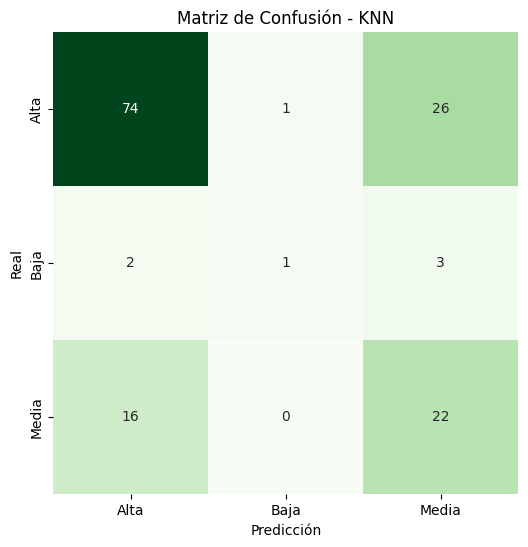

In [ ]:
# Predicciones y evaluación para KNN
y_pred_knn = grid_knn.predict(X_test_scaled)

print("\nResultados de KNN:\n", classification_report(y_test_reclas, y_pred_knn))

# Matriz de confusión para KNN
cm_knn = confusion_matrix(y_test_reclas, y_pred_knn)
plt.figure(figsize=(6,6))
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Greens", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - KNN")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()



Resultados de SVM:
               precision    recall  f1-score   support

        Alta       0.78      0.84      0.81       101
        Baja       1.00      0.17      0.29         6
       Media       0.49      0.45      0.47        38

    accuracy                           0.71       145
   macro avg       0.76      0.49      0.52       145
weighted avg       0.71      0.71      0.70       145



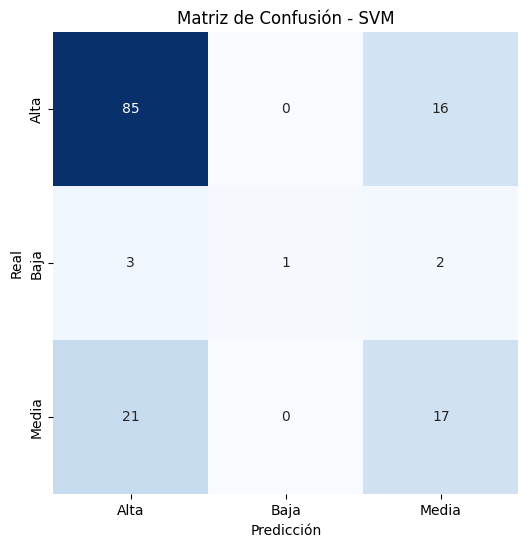

In [ ]:
# Predicciones y evaluación para SVM
y_pred_svm = grid_svm.predict(X_test_scaled)

print("\nResultados de SVM:\n", classification_report(y_test_reclas, y_pred_svm))

# Matriz de confusión para SVM
cm_svm = confusion_matrix(y_test_reclas, y_pred_svm)
plt.figure(figsize=(6,6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - SVM")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()


In [ ]:
# Binarizar las etiquetas
classes = ['Baja', 'Media', 'Alta']
y_test_bin = label_binarize(y_test_reclas, classes=classes)
n_classes = y_test_bin.shape[1]

# Para KNN
y_score_knn = grid_knn.predict_proba(X_test_scaled)

# Para SVM
y_score_svm = grid_svm.decision_function(X_test_scaled)

# Calcular AUC para KNN
roc_auc_knn = roc_auc_score(y_test_bin, y_score_knn, average='macro', multi_class='ovr')
print(f"\nAUC promedio para KNN: {roc_auc_knn:.2f}")

# Calcular AUC para SVM
roc_auc_svm = roc_auc_score(y_test_bin, y_score_svm, average='macro', multi_class='ovr')
print(f"AUC promedio para SVM: {roc_auc_svm:.2f}")



AUC promedio para KNN: 0.39
AUC promedio para SVM: 0.35


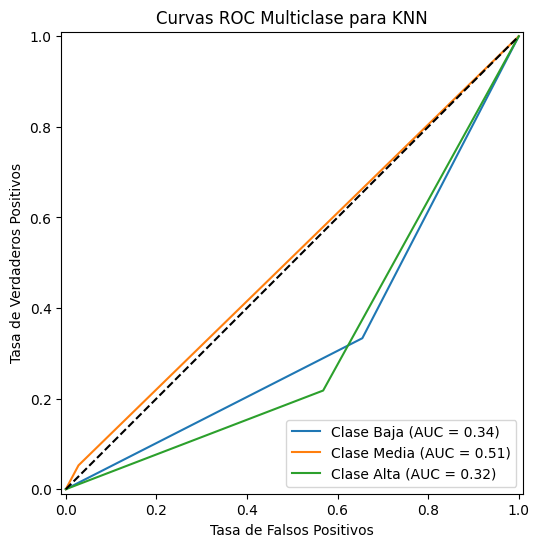

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_knn[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para KNN')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.show()


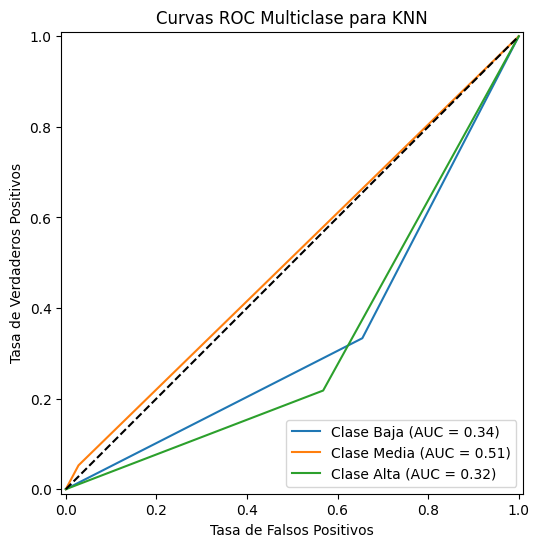

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_knn[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para KNN')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.show()


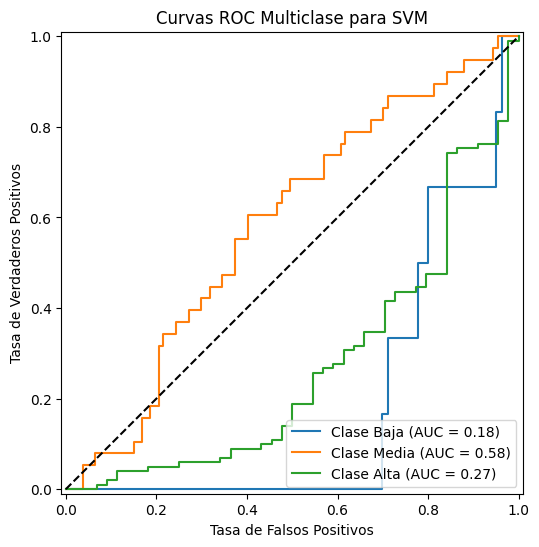

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_svm[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para SVM')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.show()


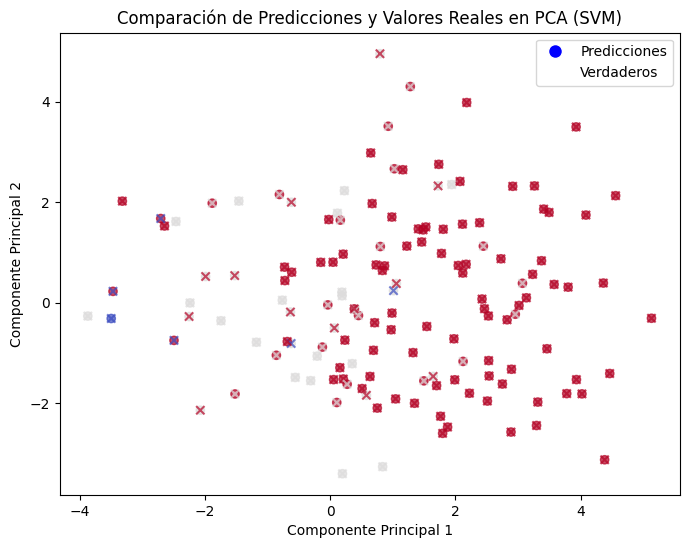

In [ ]:
# PCA en 2D de las predicciones
X_test_pca = pca_after.transform(X_test_scaled)

label_mapping = {'Baja':0, 'Media':1, 'Alta':2}

# Mapear etiquetas a números
c_pred = np.array([label_mapping[label] for label in y_pred_svm])
c_true = np.array([label_mapping[label] for label in y_test_reclas])

plt.figure(figsize=(8,6))

# Graficar predicciones
plt.scatter(
    X_test_pca[:,0], X_test_pca[:,1],
    c=c_pred,
    cmap='coolwarm', alpha=0.7, label='Predicciones'
)

# Graficar valores reales con marcador 'x'
plt.scatter(
    X_test_pca[:,0], X_test_pca[:,1],
    marker='x', c=c_true,
    cmap='coolwarm', alpha=0.7, label='Verdaderos'
)

plt.title("Comparación de Predicciones y Valores Reales en PCA (SVM)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='Predicciones', markerfacecolor='b', markersize=10),
    plt.Line2D([0], [0], marker='x', color='w', label='Verdaderos', markerfacecolor='r', markersize=10)
])
plt.show()


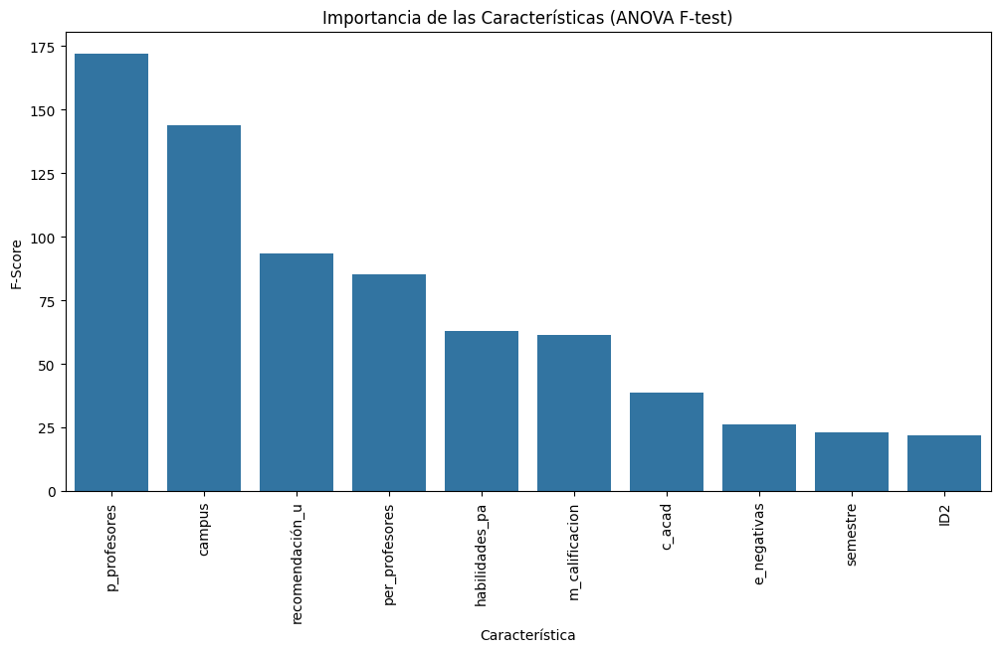

In [ ]:
from sklearn.feature_selection import f_classif

# Calcular puntuaciones F
F, pval = f_classif(X_train_bal, y_train_bal)

# Crear un DataFrame para visualizar
feature_importance = pd.DataFrame({
    'Característica': X.columns,
    'F-Score': F
})

# Ordenar por F-Score
feature_importance.sort_values('F-Score', ascending=False, inplace=True)

# Visualizar las principales características
plt.figure(figsize=(12,6))
sns.barplot(x='Característica', y='F-Score', data=feature_importance.head(10))
plt.xticks(rotation=90)
plt.title('Importancia de las Características (ANOVA F-test)')
plt.show()


In [ ]:
# Validación cruzada para KNN
skf = StratifiedKFold(n_splits=5)
scores_knn = cross_val_score(grid_knn.best_estimator_, X_train_bal, y_train_bal, cv=skf, scoring='f1_macro')
print(f"\nF1-score promedio para KNN: {scores_knn.mean():.2f}")

# Validación cruzada para SVM
scores_svm = cross_val_score(grid_svm.best_estimator_, X_train_bal, y_train_bal, cv=skf, scoring='f1_macro')
print(f"F1-score promedio para SVM: {scores_svm.mean():.2f}")



F1-score promedio para KNN: 0.90
F1-score promedio para SVM: 0.94


||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [0.81565947 0.81565947 0.84999062 0.81565947 0.78808567 0.7932564
 0.79604247 0.79053385 0.76015229 0.76406187 0.76233292 0.76134766
 0.74101225 0.75009041 0.750312   0.7596515  0.72383729 0.74552831
 0.72910877 0.74456589 0.70989921 0.73503336 0.70847307 0.73652835
 0.69395995 0.71839059 0.6946628  0.71778923 0.70008925 0.72025756
 0.68284468 0.70878343 0.68081525 0.70150707 0.68685939 0.71200407
 0.67950526 0.7017648  0.66921753 0.69744526        nan 0.8930129
        nan 0.8930129         nan 0.87938074        nan 0.88376834
        nan 0.86564227        nan 0.86597498        nan 0.84677014
        nan 0.86231193        nan 0.85572985        nan 0.85430008
        nan 0.84930513        nan 0.85130423        nan 0.84307533
        nan 0.84496466        nan 0.84136142        nan 0.84755822
        nan 0.83211191        nan 0.83780543        nan 0


Resultados de KNN:
               precision    recall  f1-score   support

        Alta       0.80      0.73      0.77       101
        Baja       0.50      0.17      0.25         6
       Media       0.43      0.58      0.49        38

    accuracy                           0.67       145
   macro avg       0.58      0.49      0.50       145
weighted avg       0.69      0.67      0.67       145



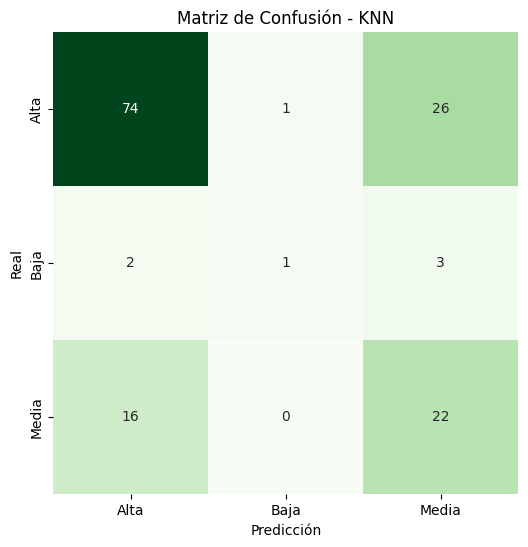


Resultados de SVM:
               precision    recall  f1-score   support

        Alta       0.78      0.84      0.81       101
        Baja       1.00      0.17      0.29         6
       Media       0.49      0.45      0.47        38

    accuracy                           0.71       145
   macro avg       0.76      0.49      0.52       145
weighted avg       0.71      0.71      0.70       145



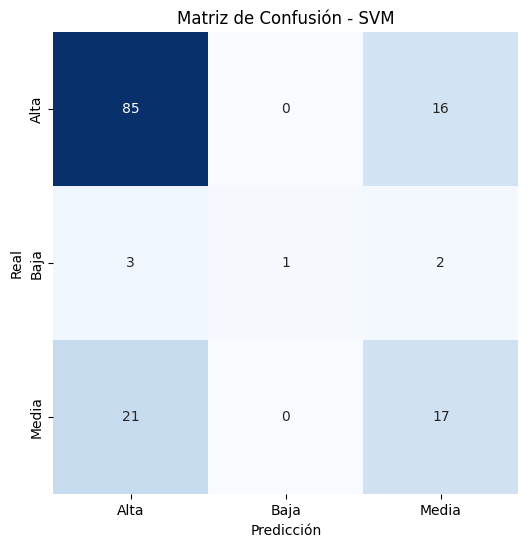


AUC promedio para KNN: 0.39
AUC promedio para SVM: 0.34


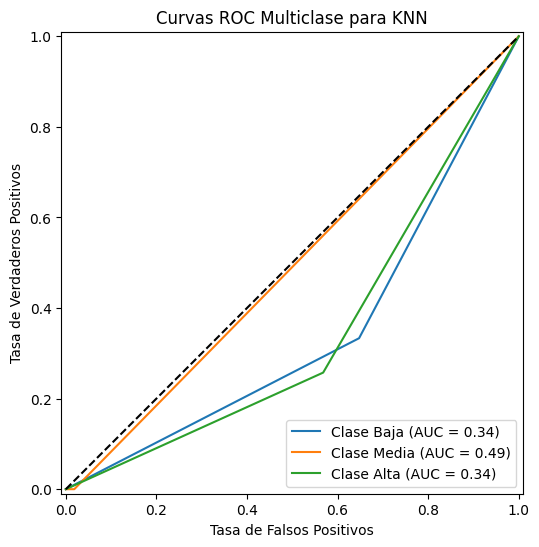

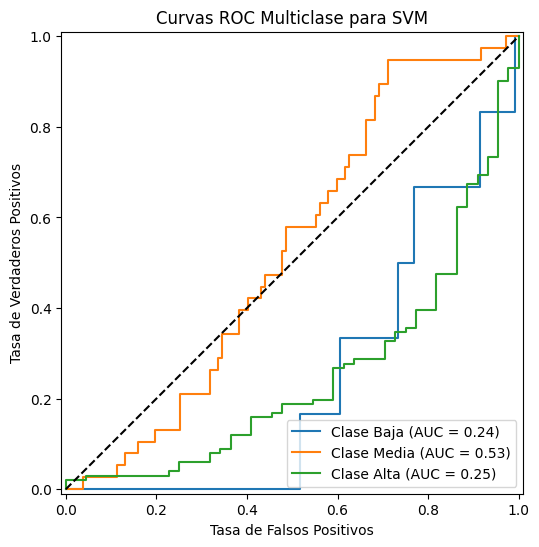

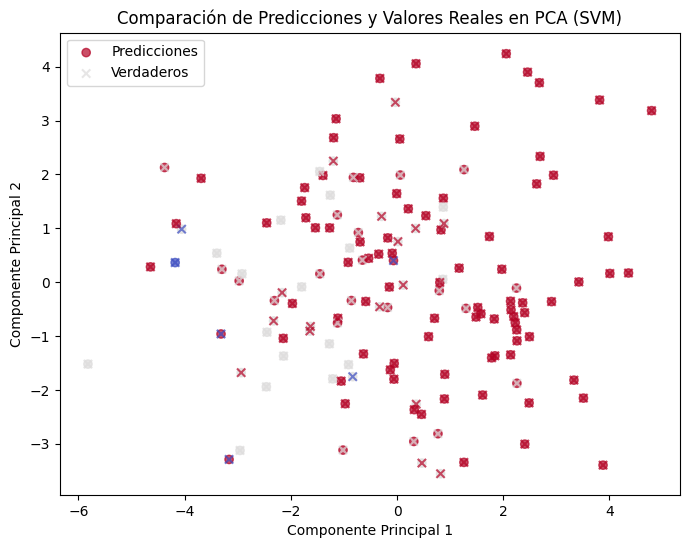

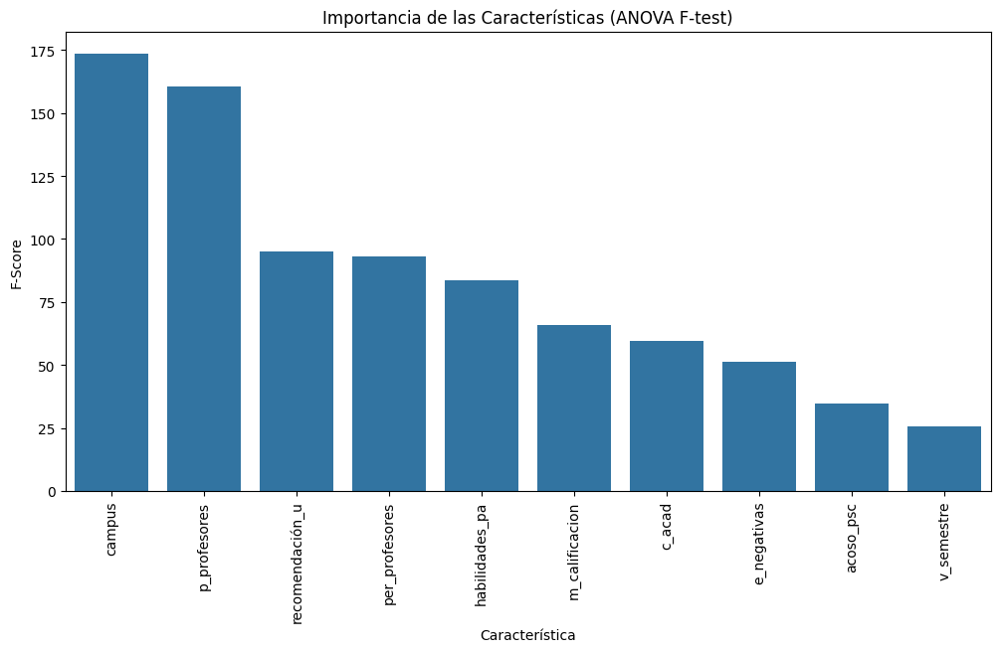


F1-score promedio para KNN: 0.89
F1-score promedio para SVM: 0.94


In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import f_classif
from sklearn.metrics import RocCurveDisplay

# Manejo de desequilibrios
from imblearn.over_sampling import SMOTE

# Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D

# Cargar datos
datos = pd.read_excel('DF_final_numerico.xlsx')

# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        df[columna] = df[columna].apply(lambda x: limite_inferior if x < limite_inferior else (limite_superior if x > limite_superior else x))
    return df

columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Ajustes adicionales
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()
columnas_constantes = [col for col in datos_sin_outliers.columns if datos_sin_outliers[col].std() == 0]
datos_sin_outliers = datos_sin_outliers.drop(columns=columnas_constantes)

# Exploración de datos
X = datos_sin_outliers.drop(columns=['motivacion'])
y = datos_sin_outliers['motivacion']

# División del conjunto de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Escalado de características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reclasificación de la variable objetivo
def reclasificar_motivacion(motivacion):
    if motivacion <= 4:
        return 'Baja'
    elif 5 <= motivacion <= 7:
        return 'Media'
    else:
        return 'Alta'

y_train_reclas = y_train.map(reclasificar_motivacion)
y_test_reclas = y_test.map(reclasificar_motivacion)

# Balanceo con SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_scaled, y_train_reclas)

# GridSearch para KNN
knn = KNeighborsClassifier()
param_knn = {
    'n_neighbors': range(1, 21),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev']
}

grid_knn = GridSearchCV(knn, param_knn, cv=5, scoring='f1_macro', n_jobs=-1)
grid_knn.fit(X_train_bal, y_train_bal)

# Predicciones y evaluación para KNN
y_pred_knn = grid_knn.predict(X_test_scaled)
print("\nResultados de KNN:\n", classification_report(y_test_reclas, y_pred_knn))

# Matriz de confusión para KNN
cm_knn = confusion_matrix(y_test_reclas, y_pred_knn)
plt.figure(figsize=(6,6))
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Greens", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - KNN")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()

# GridSearch para SVM
svm = SVC(probability=True, random_state=42)
param_svm = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'kernel': ['linear', 'rbf']
}

grid_svm = GridSearchCV(svm, param_svm, cv=5, scoring='f1_macro', n_jobs=-1)
grid_svm.fit(X_train_bal, y_train_bal)

# Predicciones y evaluación para SVM
y_pred_svm = grid_svm.predict(X_test_scaled)
print("\nResultados de SVM:\n", classification_report(y_test_reclas, y_pred_svm))

# Matriz de confusión para SVM
cm_svm = confusion_matrix(y_test_reclas, y_pred_svm)
plt.figure(figsize=(6,6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - SVM")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()

# Binarizar las etiquetas
classes = ['Baja', 'Media', 'Alta']
y_test_bin = label_binarize(y_test_reclas, classes=classes)
n_classes = y_test_bin.shape[1]

# Para KNN
y_score_knn = grid_knn.predict_proba(X_test_scaled)

# Para SVM
y_score_svm = grid_svm.decision_function(X_test_scaled)

# Calcular AUC para KNN
roc_auc_knn = roc_auc_score(y_test_bin, y_score_knn, average='macro', multi_class='ovr')
print(f"\nAUC promedio para KNN: {roc_auc_knn:.2f}")

# Calcular AUC para SVM
roc_auc_svm = roc_auc_score(y_test_bin, y_score_svm, average='macro', multi_class='ovr')
print(f"AUC promedio para SVM: {roc_auc_svm:.2f}")

# Curvas ROC Multiclase para KNN
fig, ax = plt.subplots(figsize=(8, 6))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_knn[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para KNN')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.show()

# Curvas ROC Multiclase para SVM
fig, ax = plt.subplots(figsize=(8, 6))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_svm[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para SVM')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.show()

# PCA en 2D de las predicciones
pca_after = PCA(n_components=2, random_state=42)
X_test_pca = pca_after.fit_transform(X_test_scaled)

label_mapping = {'Baja':0, 'Media':1, 'Alta':2}

c_pred = np.array([label_mapping[label] for label in y_pred_svm])
c_true = np.array([label_mapping[label] for label in y_test_reclas])

plt.figure(figsize=(8,6))

# Graficar predicciones
plt.scatter(
    X_test_pca[:,0], X_test_pca[:,1],
    c=c_pred,
    cmap='coolwarm', alpha=0.7, label='Predicciones'
)

# Graficar valores reales con marcador 'x'
plt.scatter(
    X_test_pca[:,0], X_test_pca[:,1],
    marker='x', c=c_true,
    cmap='coolwarm', alpha=0.7, label='Verdaderos'
)

plt.title("Comparación de Predicciones y Valores Reales en PCA (SVM)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.show()

# Importancia de las características con ANOVA F-test
F, pval = f_classif(X_train_bal, y_train_bal)
feature_importance = pd.DataFrame({
    'Característica': X.columns,
    'F-Score': F
})
feature_importance.sort_values('F-Score', ascending=False, inplace=True)

plt.figure(figsize=(12,6))
sns.barplot(x='Característica', y='F-Score', data=feature_importance.head(10))
plt.xticks(rotation=90)
plt.title('Importancia de las Características (ANOVA F-test)')
plt.show()

# Validación cruzada para KNN
skf = StratifiedKFold(n_splits=5)
scores_knn = cross_val_score(grid_knn.best_estimator_, X_train_bal, y_train_bal, cv=skf, scoring='f1_macro')
print(f"\nF1-score promedio para KNN: {scores_knn.mean():.2f}")

# Validación cruzada para SVM
scores_svm = cross_val_score(grid_svm.best_estimator_, X_train_bal, y_train_bal, cv=skf, scoring='f1_macro')
print(f"F1-score promedio para SVM: {scores_svm.mean():.2f}")



Resultados de KNN:
               precision    recall  f1-score   support

        Alta       0.90      0.59      0.71       101
        Baja       0.16      0.50      0.24         6
       Media       0.49      0.76      0.60        38

    accuracy                           0.63       145
   macro avg       0.51      0.62      0.52       145
weighted avg       0.76      0.63      0.66       145



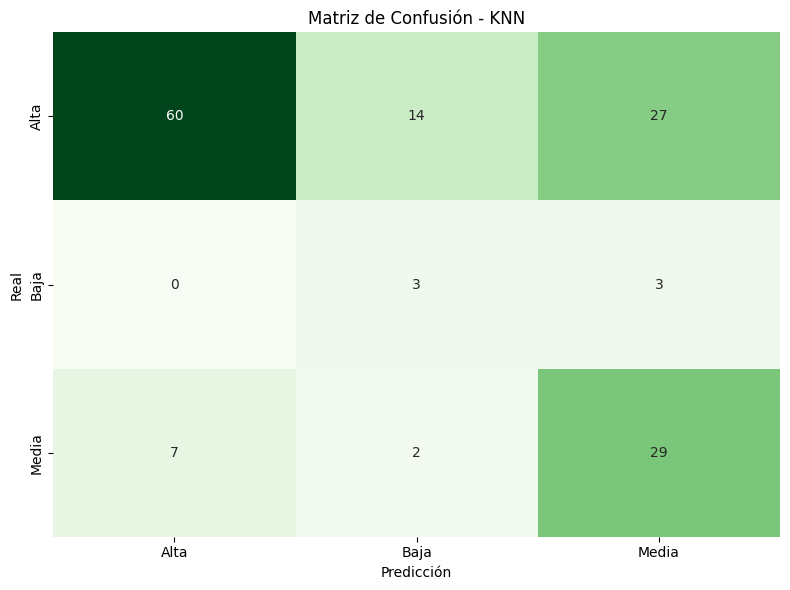


Resultados de SVM:
               precision    recall  f1-score   support

        Alta       0.82      0.69      0.75       101
        Baja       0.22      0.33      0.27         6
       Media       0.39      0.53      0.45        38

    accuracy                           0.63       145
   macro avg       0.48      0.52      0.49       145
weighted avg       0.69      0.63      0.65       145



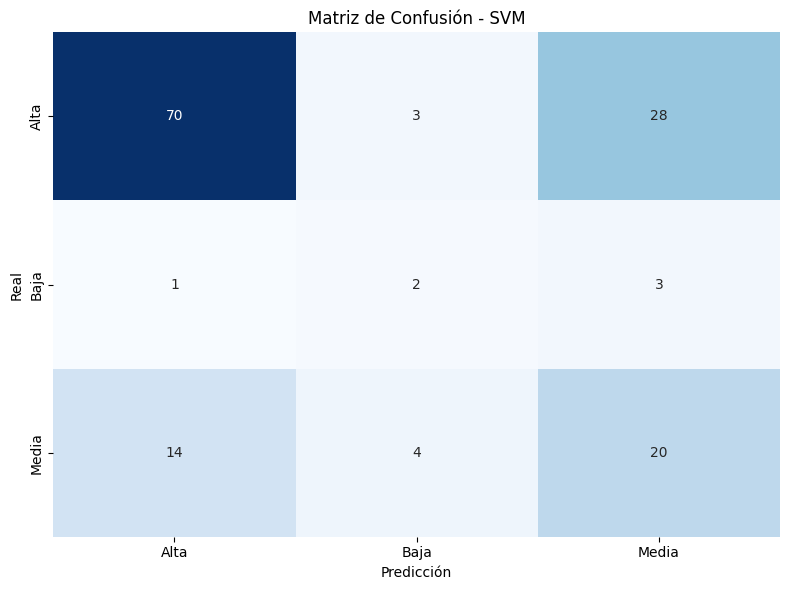


AUC promedio para KNN: 0.27
AUC promedio para SVM: 0.45


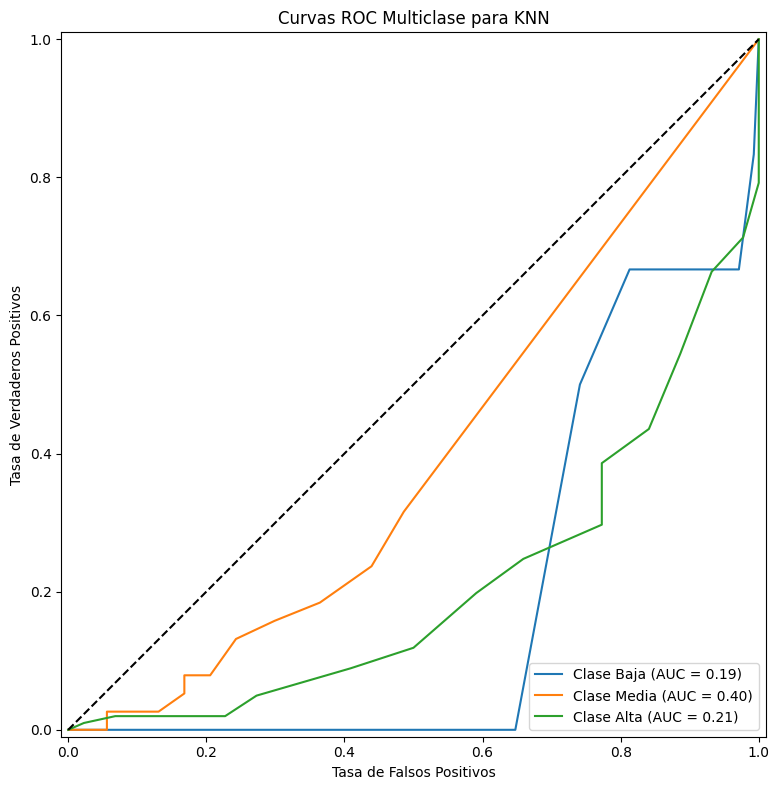

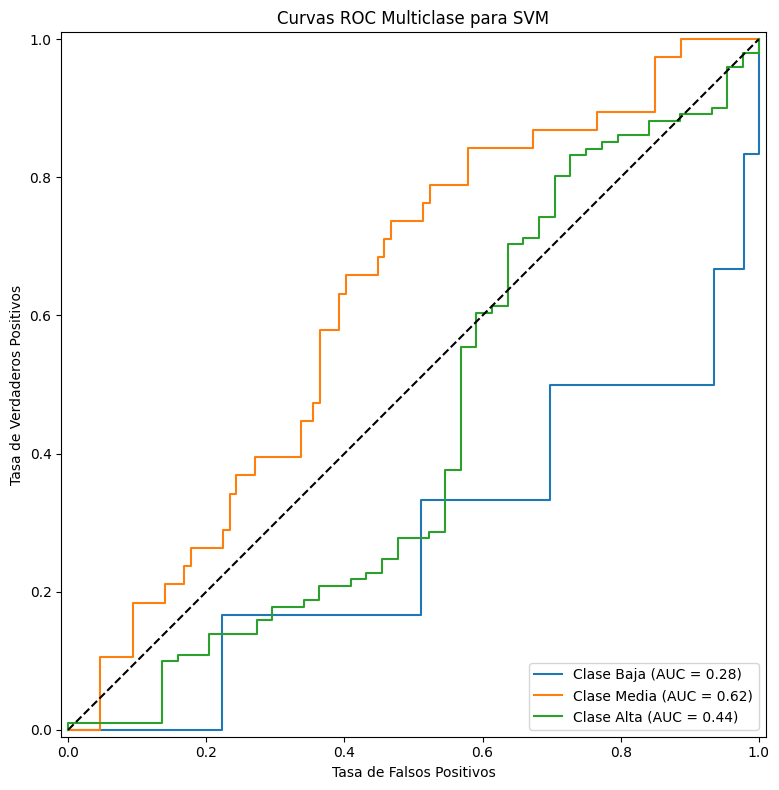

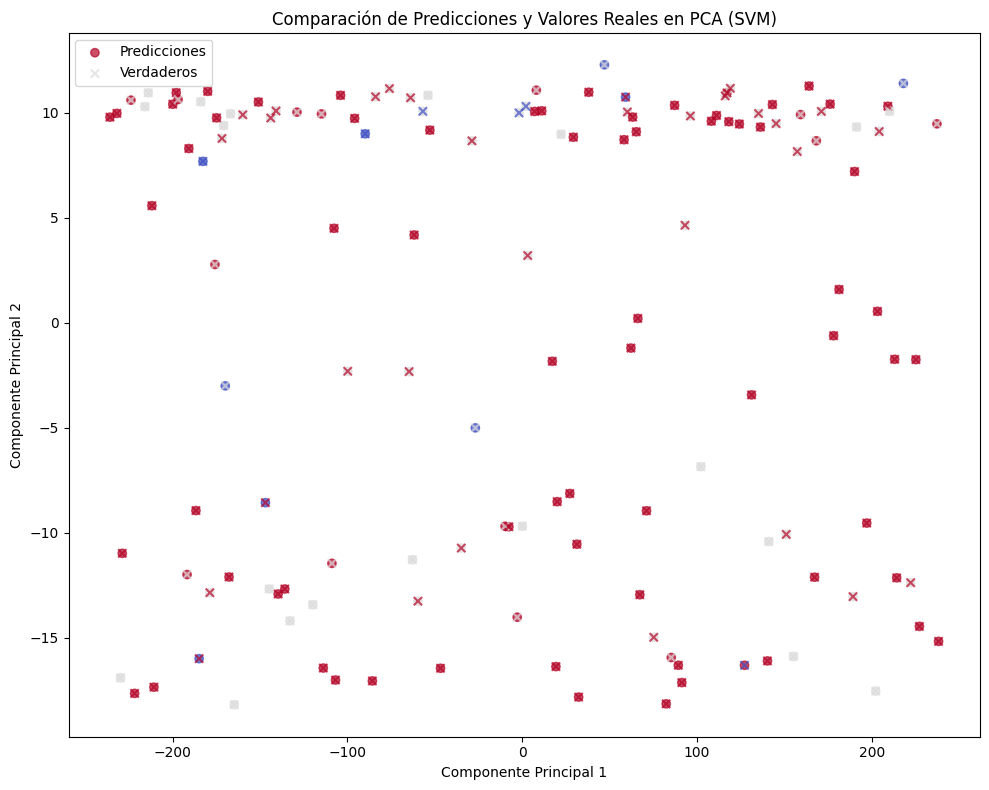

<ipython-input-68-732d90eadcc2>:221: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Característica', y='F-Score', data=feature_importance.head(10), palette='viridis')


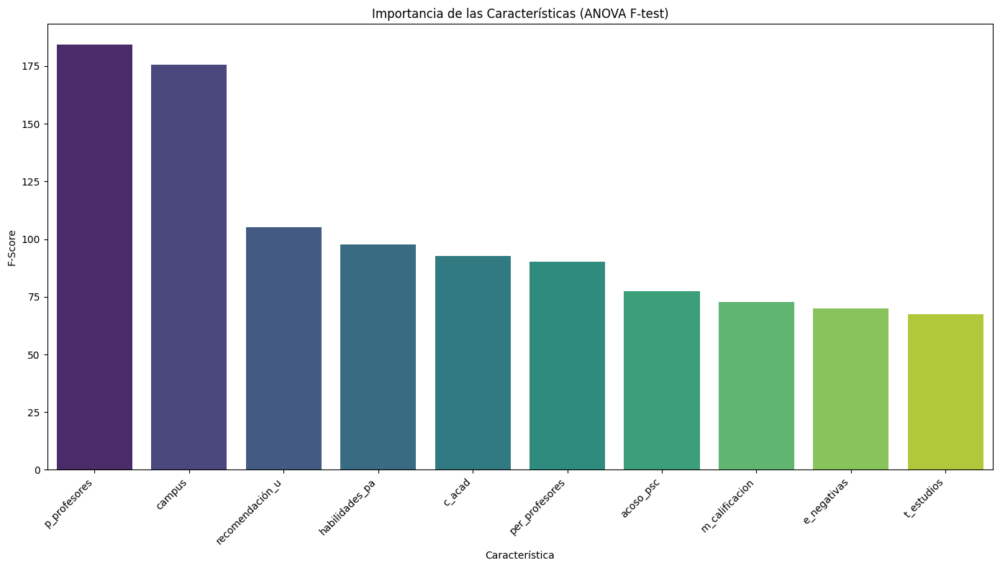


F1-score promedio para KNN: 0.44
F1-score promedio para SVM: 0.44


In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import f_classif
from sklearn.metrics import RocCurveDisplay
from sklearn.pipeline import Pipeline
from imblearn.pipeline import make_pipeline

# Manejo de desequilibrios
from imblearn.over_sampling import SMOTE

# Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D

# Cargar datos
datos = pd.read_excel('DF_final_numerico.xlsx')

# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        df[columna] = df[columna].apply(lambda x: limite_inferior if x < limite_inferior else (limite_superior if x > limite_superior else x))
    return df

columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Ajustes adicionales
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()
columnas_constantes = [col for col in datos_sin_outliers.columns if datos_sin_outliers[col].std() == 0]
datos_sin_outliers = datos_sin_outliers.drop(columns=columnas_constantes)

# Exploración de datos
X = datos_sin_outliers.drop(columns=['motivacion'])
y = datos_sin_outliers['motivacion']

# División del conjunto de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Escalado de características y Balanceo con SMOTE
smote = SMOTE(random_state=42)
scaler = StandardScaler()

# Reclasificación de la variable objetivo
def reclasificar_motivacion(motivacion):
    if motivacion <= 4:
        return 'Baja'
    elif 5 <= motivacion <= 7:
        return 'Media'
    else:
        return 'Alta'

y_train_reclas = y_train.map(reclasificar_motivacion)
y_test_reclas = y_test.map(reclasificar_motivacion)

# Balancear los datos
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train_reclas)

# Crear pipeline para KNN
knn_pipeline = make_pipeline(StandardScaler(), SMOTE(random_state=42), KNeighborsClassifier())
param_knn = {
    'kneighborsclassifier__n_neighbors': range(1, 21),
    'kneighborsclassifier__weights': ['uniform', 'distance'],
    'kneighborsclassifier__metric': ['euclidean', 'manhattan', 'chebyshev']
}

grid_knn = GridSearchCV(knn_pipeline, param_knn, cv=5, scoring='f1_macro', n_jobs=-1)
grid_knn.fit(X_train, y_train_reclas)

# Predicciones y evaluación para KNN
y_pred_knn = grid_knn.predict(X_test)
print("\nResultados de KNN:\n", classification_report(y_test_reclas, y_pred_knn, zero_division=0))

# Matriz de confusión para KNN
cm_knn = confusion_matrix(y_test_reclas, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Greens", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - KNN")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

# Crear pipeline para SVM
svm_pipeline = make_pipeline(StandardScaler(), SMOTE(random_state=42), SVC(probability=True, random_state=42))
param_svm = {
    'svc__C': [0.1, 1, 10],
    'svc__gamma': ['scale', 'auto'],
    'svc__kernel': ['linear', 'rbf']
}

grid_svm = GridSearchCV(svm_pipeline, param_svm, cv=5, scoring='f1_macro', n_jobs=-1)
grid_svm.fit(X_train, y_train_reclas)

# Predicciones y evaluación para SVM
y_pred_svm = grid_svm.predict(X_test)
print("\nResultados de SVM:\n", classification_report(y_test_reclas, y_pred_svm, zero_division=0))

# Matriz de confusión para SVM
cm_svm = confusion_matrix(y_test_reclas, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
plt.title("Matriz de Confusión - SVM")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

# Binarizar las etiquetas para curvas ROC
classes = ['Baja', 'Media', 'Alta']
y_test_bin = label_binarize(y_test_reclas, classes=classes)
n_classes = y_test_bin.shape[1]

# Para KNN
y_score_knn = grid_knn.decision_function(X_test) if hasattr(grid_knn.best_estimator_[-1], 'decision_function') else grid_knn.predict_proba(X_test)

# Para SVM
y_score_svm = grid_svm.decision_function(X_test)

# Calcular AUC para KNN
roc_auc_knn = roc_auc_score(y_test_bin, y_score_knn, average='macro', multi_class='ovr')
print(f"\nAUC promedio para KNN: {roc_auc_knn:.2f}")

# Calcular AUC para SVM
roc_auc_svm = roc_auc_score(y_test_bin, y_score_svm, average='macro', multi_class='ovr')
print(f"AUC promedio para SVM: {roc_auc_svm:.2f}")

# Curvas ROC Multiclase para KNN
fig, ax = plt.subplots(figsize=(10, 8))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_knn[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para KNN')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Curvas ROC Multiclase para SVM
fig, ax = plt.subplots(figsize=(10, 8))
for i, class_label in enumerate(classes):
    RocCurveDisplay.from_predictions(
        y_test_bin[:, i],
        y_score_svm[:, i],
        name=f"Clase {class_label}",
        ax=ax,
    )
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Multiclase para SVM')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# PCA en 2D de las predicciones
pca_after = PCA(n_components=2, random_state=42)
X_test_pca = pca_after.fit_transform(X_test)

label_mapping = {'Baja': 0, 'Media': 1, 'Alta': 2}

c_pred = np.array([label_mapping[label] for label in y_pred_svm])
c_true = np.array([label_mapping[label] for label in y_test_reclas])

plt.figure(figsize=(10, 8))

# Graficar predicciones
plt.scatter(
    X_test_pca[:, 0], X_test_pca[:, 1],
    c=c_pred,
    cmap='coolwarm', alpha=0.7, label='Predicciones'
)

# Graficar valores reales con marcador 'x'
plt.scatter(
    X_test_pca[:, 0], X_test_pca[:, 1],
    marker='x', c=c_true,
    cmap='coolwarm', alpha=0.7, label='Verdaderos'
)

plt.title("Comparación de Predicciones y Valores Reales en PCA (SVM)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.tight_layout()
plt.show()

# Importancia de las características con ANOVA F-test
F, pval = f_classif(X_train_bal, y_train_bal)
feature_importance = pd.DataFrame({
    'Característica': X.columns,
    'F-Score': F
})
feature_importance.sort_values('F-Score', ascending=False, inplace=True)

plt.figure(figsize=(14, 8))
sns.barplot(x='Característica', y='F-Score', data=feature_importance.head(10), palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Importancia de las Características (ANOVA F-test)')
plt.tight_layout()
plt.show()

# Validación cruzada para KNN
skf = StratifiedKFold(n_splits=5)
scores_knn = cross_val_score(grid_knn.best_estimator_, X_train, y_train_reclas, cv=skf, scoring='f1_macro')
print(f"\nF1-score promedio para KNN: {scores_knn.mean():.2f}")

# Validación cruzada para SVM
scores_svm = cross_val_score(grid_svm.best_estimator_, X_train, y_train_reclas, cv=skf, scoring='f1_macro')
print(f"F1-score promedio para SVM: {scores_svm.mean():.2f}")



Entrenando y evaluando modelo: KNN


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Mejores parámetros para KNN: {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 20, 'kneighborsclassifier__weights': 'uniform'}
Resultados de KNN:
              precision    recall  f1-score   support

        Alta       0.90      0.59      0.71       101
        Baja       0.16      0.50      0.24         6
       Media       0.49      0.76      0.60        38

    accuracy                           0.63       145
   macro avg       0.51      0.62      0.52       145
weighted avg       0.76      0.63      0.66       145



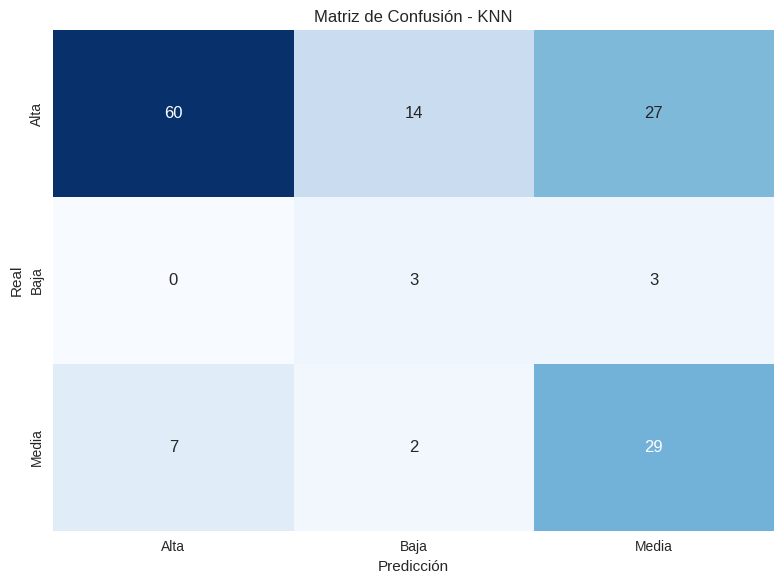


Entrenando y evaluando modelo: SVM

Mejores parámetros para SVM: {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Resultados de SVM:
              precision    recall  f1-score   support

        Alta       0.82      0.69      0.75       101
        Baja       0.22      0.33      0.27         6
       Media       0.39      0.53      0.45        38

    accuracy                           0.63       145
   macro avg       0.48      0.52      0.49       145
weighted avg       0.69      0.63      0.65       145



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


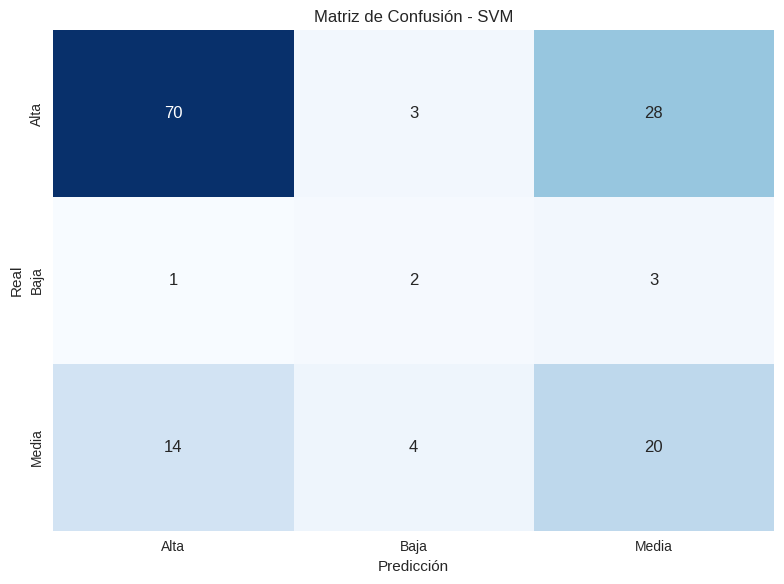


Entrenando y evaluando modelo: RandomForest


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Mejores parámetros para RandomForest: {'randomforestclassifier__max_depth': 10, 'randomforestclassifier__min_samples_split': 5, 'randomforestclassifier__n_estimators': 100}
Resultados de RandomForest:
              precision    recall  f1-score   support

        Alta       0.85      0.87      0.86       101
        Baja       1.00      0.17      0.29         6
       Media       0.60      0.63      0.62        38

    accuracy                           0.78       145
   macro avg       0.82      0.56      0.59       145
weighted avg       0.79      0.78      0.77       145



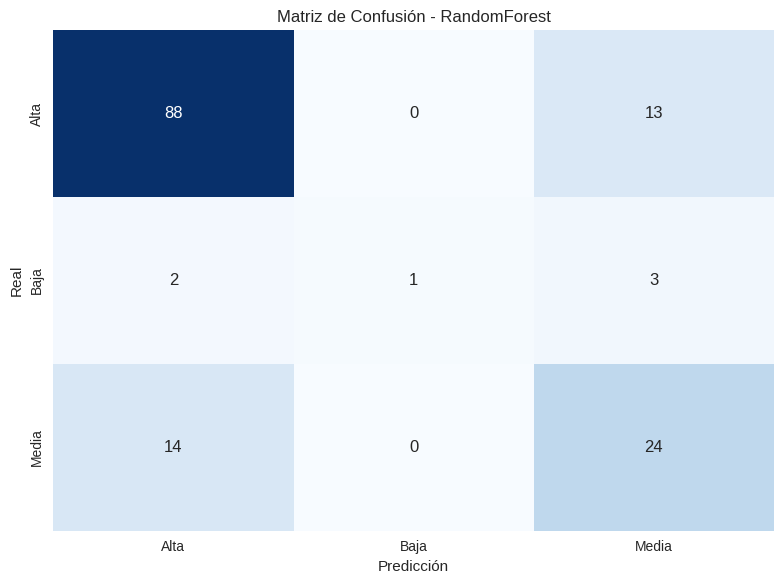


Entrenando y evaluando modelo: GradientBoosting


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Mejores parámetros para GradientBoosting: {'gradientboostingclassifier__learning_rate': 0.2, 'gradientboostingclassifier__max_depth': 3, 'gradientboostingclassifier__n_estimators': 200}
Resultados de GradientBoosting:
              precision    recall  f1-score   support

        Alta       0.80      0.84      0.82       101
        Baja       1.00      0.17      0.29         6
       Media       0.47      0.47      0.47        38

    accuracy                           0.72       145
   macro avg       0.76      0.49      0.53       145
weighted avg       0.72      0.72      0.71       145



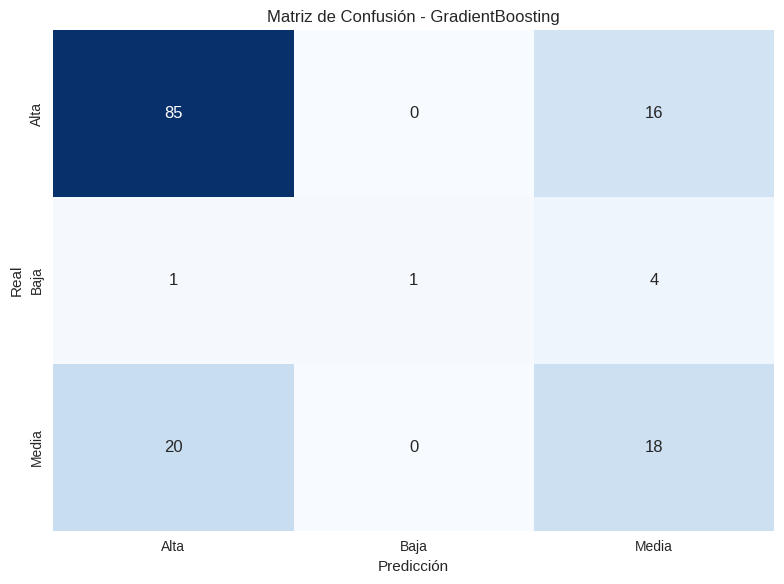

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Curvas ROC para KNN


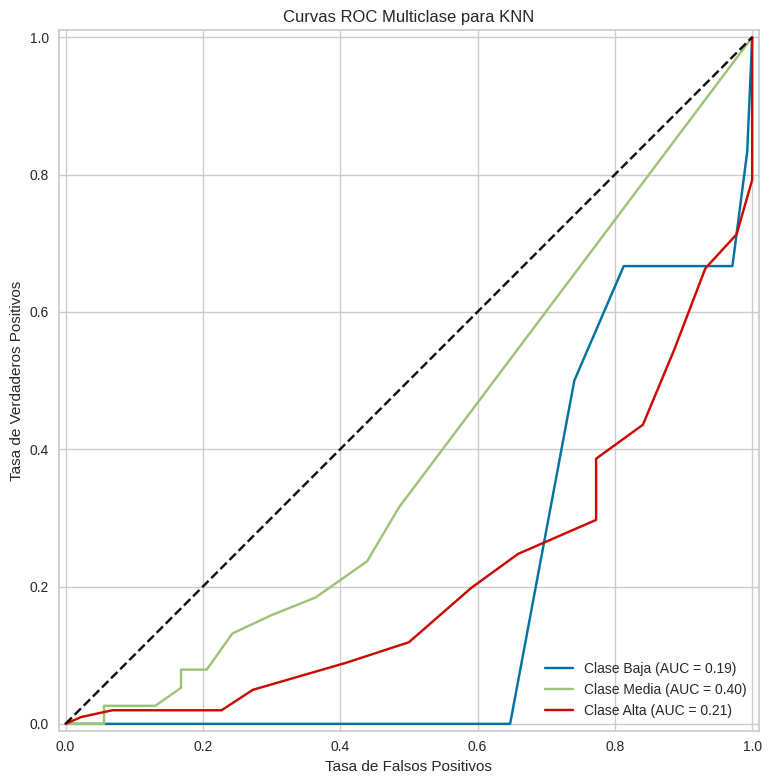

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Curvas ROC para SVM


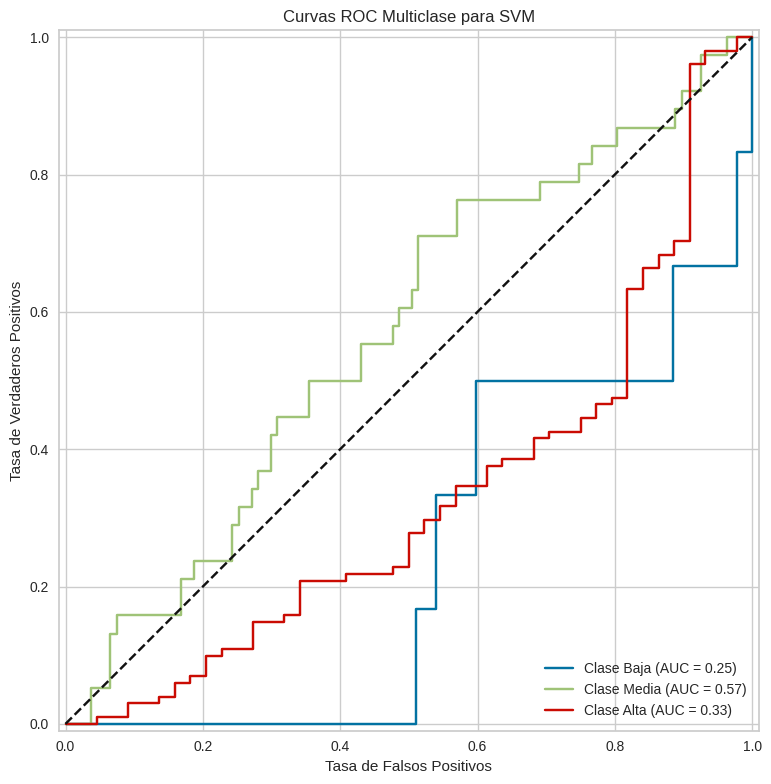

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Curvas ROC para RandomForest


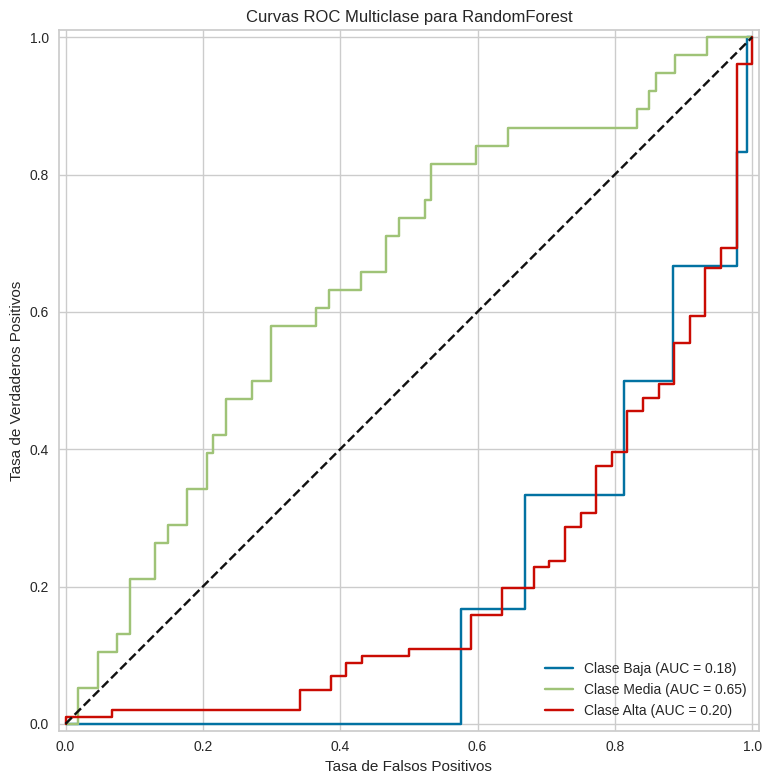

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Curvas ROC para GradientBoosting


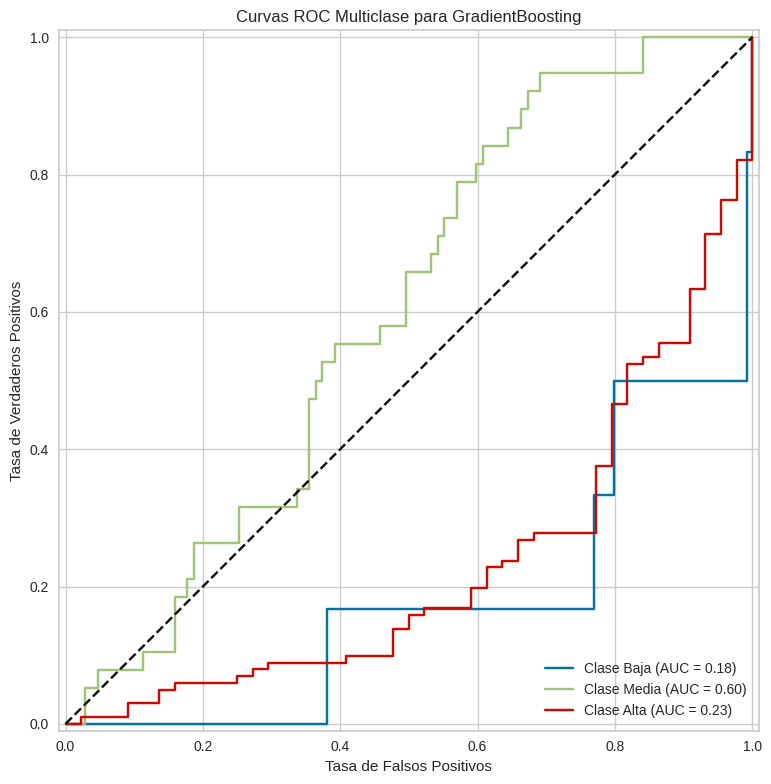

El mejor modelo fue: GradientBoosting


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


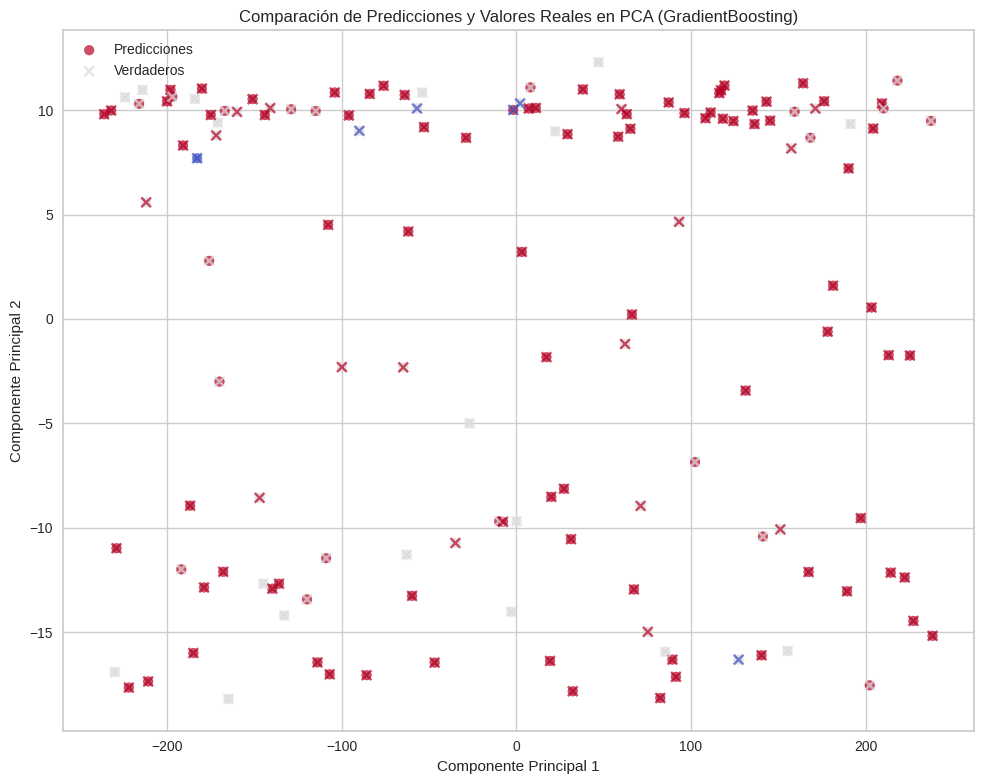

<ipython-input-70-eac2952a612c>:198: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Característica', y='Importancia', data=feature_importance.head(10), palette='viridis')


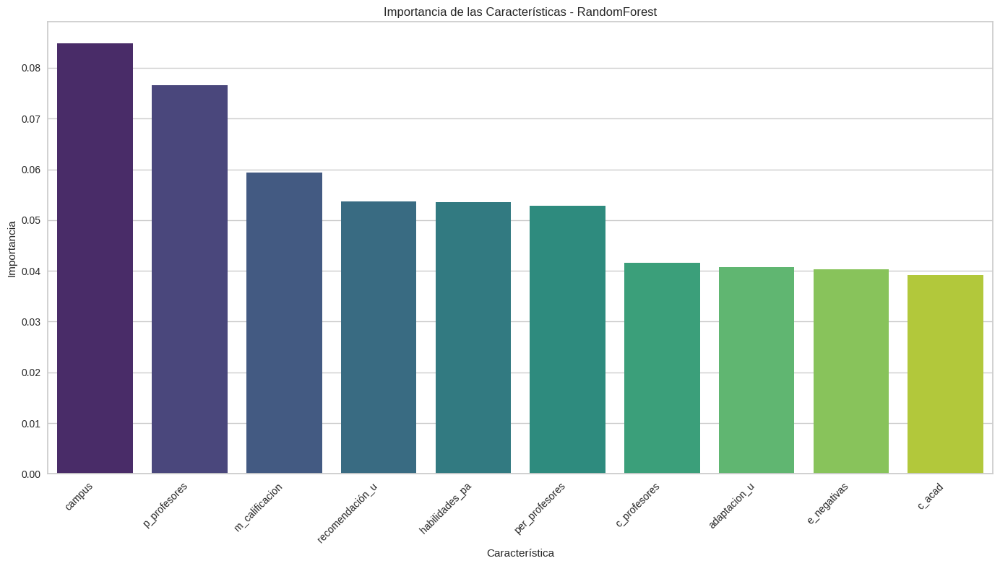


F1-score promedio para KNN: 0.44

F1-score promedio para SVM: 0.44

F1-score promedio para RandomForest: 0.54

F1-score promedio para GradientBoosting: 0.55


In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento y modelado
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE

# Cargar datos
datos = pd.read_excel('DF_final_numerico.xlsx')

# Identificación y corrección de outliers
def eliminar_outliers(df, columnas):
    for columna in columnas:
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        df[columna] = df[columna].clip(lower=limite_inferior, upper=limite_superior)
    return df

columnas_numericas = datos.select_dtypes(include=['float64', 'int64']).columns.tolist()
columnas_numericas = [col for col in columnas_numericas if col not in ['ID_s', 'ID2']]
datos_sin_outliers = eliminar_outliers(datos, columnas_numericas)

# Ajustes adicionales
datos_sin_outliers['edad'] = datos_sin_outliers['edad'].apply(lambda x: max(x, 16))
datos_sin_outliers['transporte'] = datos_sin_outliers['transporte'].round()
datos_sin_outliers = datos_sin_outliers.loc[:, datos_sin_outliers.nunique() > 1]

# Exploración de datos
X = datos_sin_outliers.drop(columns=['motivacion'])
y = datos_sin_outliers['motivacion']

# División del conjunto de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Escalado de características y Balanceo con SMOTE
smote = SMOTE(random_state=42)
scaler = StandardScaler()

# Reclasificación de la variable objetivo
def reclasificar_motivacion(motivacion):
    if motivacion <= 4:
        return 'Baja'
    elif 5 <= motivacion <= 7:
        return 'Media'
    else:
        return 'Alta'

y_train_reclas = y_train.map(reclasificar_motivacion)
y_test_reclas = y_test.map(reclasificar_motivacion)

# Balancear los datos
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train_reclas)

# Selección de características con ANOVA F-test
selector = SelectKBest(score_func=f_classif, k='all')
X_train_bal = selector.fit_transform(X_train_bal, y_train_bal)
X_test = selector.transform(X_test)

# Crear pipelines para los modelos y parámetros para GridSearch
pipelines_params = {
    'KNN': {
        'pipeline': make_pipeline(StandardScaler(), SMOTE(random_state=42), KNeighborsClassifier()),
        'params': {
            'kneighborsclassifier__n_neighbors': range(1, 21),
            'kneighborsclassifier__weights': ['uniform', 'distance'],
            'kneighborsclassifier__metric': ['euclidean', 'manhattan', 'chebyshev']
        }
    },
    'SVM': {
        'pipeline': make_pipeline(StandardScaler(), SMOTE(random_state=42), SVC(probability=True, random_state=42)),
        'params': {
            'svc__C': [0.1, 1, 10],
            'svc__gamma': ['scale', 'auto'],
            'svc__kernel': ['linear', 'rbf']
        }
    },
    'RandomForest': {
        'pipeline': make_pipeline(StandardScaler(), SMOTE(random_state=42), RandomForestClassifier(random_state=42)),
        'params': {
            'randomforestclassifier__n_estimators': [100, 200],
            'randomforestclassifier__max_depth': [None, 10, 20],
            'randomforestclassifier__min_samples_split': [2, 5]
        }
    },
    'GradientBoosting': {
        'pipeline': make_pipeline(StandardScaler(), SMOTE(random_state=42), GradientBoostingClassifier(random_state=42)),
        'params': {
            'gradientboostingclassifier__n_estimators': [100, 200],
            'gradientboostingclassifier__learning_rate': [0.01, 0.1, 0.2],
            'gradientboostingclassifier__max_depth': [3, 5, 10]
        }
    }
}

# Entrenamiento y evaluación de los modelos
best_models = {}
for model_name, pipeline_dict in pipelines_params.items():
    print(f"\nEntrenando y evaluando modelo: {model_name}")
    grid = GridSearchCV(pipeline_dict['pipeline'], pipeline_dict['params'], cv=5, scoring='f1_macro', n_jobs=-1)
    grid.fit(X_train, y_train_reclas)
    best_models[model_name] = grid.best_estimator_
    y_pred = grid.predict(X_test)
    print(f"\nMejores parámetros para {model_name}: {grid.best_params_}")
    print(f"Resultados de {model_name}:")
    print(classification_report(y_test_reclas, y_pred, zero_division=0))

    # Matriz de confusión
    cm = confusion_matrix(y_test_reclas, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Alta', 'Baja', 'Media'], yticklabels=['Alta', 'Baja', 'Media'])
    plt.title(f"Matriz de Confusión - {model_name}")
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()

# Curvas ROC Multiclase para todos los modelos
classes = ['Baja', 'Media', 'Alta']
y_test_bin = label_binarize(y_test_reclas, classes=classes)
n_classes = y_test_bin.shape[1]

for model_name, model in best_models.items():
    if hasattr(model[-1], 'predict_proba'):
        y_score = model.predict_proba(X_test)
    else:
        y_score = model.decision_function(X_test)

    print(f"\nCurvas ROC para {model_name}")
    fig, ax = plt.subplots(figsize=(10, 8))
    for i, class_label in enumerate(classes):
        RocCurveDisplay.from_predictions(
            y_test_bin[:, i],
            y_score[:, i],
            name=f"Clase {class_label}",
            ax=ax,
        )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'Curvas ROC Multiclase para {model_name}')
    plt.xlabel('Tasa de Falsos Positivos')
    plt.ylabel('Tasa de Verdaderos Positivos')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

# PCA en 2D de las predicciones para el mejor modelo
best_model_name = max(best_models.keys(), key=lambda m: cross_val_score(best_models[m], X_train, y_train_reclas, cv=StratifiedKFold(n_splits=5), scoring='f1_macro').mean())
print(f"El mejor modelo fue: {best_model_name}")

pca_after = PCA(n_components=2, random_state=42)
X_test_pca = pca_after.fit_transform(X_test)

label_mapping = {'Baja': 0, 'Media': 1, 'Alta': 2}
c_pred = np.array([label_mapping[label] for label in best_models[best_model_name].predict(X_test)])
c_true = np.array([label_mapping[label] for label in y_test_reclas])

plt.figure(figsize=(10, 8))
plt.scatter(
    X_test_pca[:, 0], X_test_pca[:, 1],
    c=c_pred,
    cmap='coolwarm', alpha=0.7, label='Predicciones'
)
plt.scatter(
    X_test_pca[:, 0], X_test_pca[:, 1],
    marker='x', c=c_true,
    cmap='coolwarm', alpha=0.7, label='Verdaderos'
)
plt.title(f"Comparación de Predicciones y Valores Reales en PCA ({best_model_name})")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.tight_layout()
plt.show()

# Importancia de las características para el modelo RandomForest
if 'RandomForest' in best_models:
    importances = best_models['RandomForest'].named_steps['randomforestclassifier'].feature_importances_
    feature_names = X.columns[selector.get_support()]
    feature_importance = pd.DataFrame({'Característica': feature_names, 'Importancia': importances})
    feature_importance.sort_values('Importancia', ascending=False, inplace=True)

    plt.figure(figsize=(14, 8))
    sns.barplot(x='Característica', y='Importancia', data=feature_importance.head(10), palette='viridis')
    plt.xticks(rotation=45, ha='right')
    plt.title('Importancia de las Características - RandomForest')
    plt.tight_layout()
    plt.show()

# Validación cruzada para todos los modelos
for model_name, model in best_models.items():
    scores = cross_val_score(model, X_train, y_train_reclas, cv=StratifiedKFold(n_splits=5), scoring='f1_macro')
    print(f"\nF1-score promedio para {model_name}: {scores.mean():.2f}")


Descripción de los datos:
              ID_s         ID2     carrera  promedio_acad        edad  \
count  483.000000  483.000000  483.000000     483.000000  483.000000   
mean     1.420290  242.000000    0.374741       3.819462   21.089027   
std      0.494117  139.574353    0.484558       0.351396    3.683870   
min      1.000000    1.000000    0.000000       2.800000   10.000000   
25%      1.000000  121.500000    0.000000       3.600000   19.000000   
50%      1.000000  242.000000    0.000000       3.900000   20.000000   
75%      2.000000  362.500000    1.000000       4.000000   22.000000   
max      2.000000  483.000000    1.000000       4.600000   45.000000   

           sisben  transporte    semestre      o_voca   e_carrera  ...  \
count  483.000000  483.000000  483.000000  483.000000  483.000000  ...   
mean    17.080745    2.824017    5.449275    4.505176   16.099379  ...   
std     10.840589    1.606549    3.025996    1.398530    2.699789  ...   
min      0.000000    0.00000

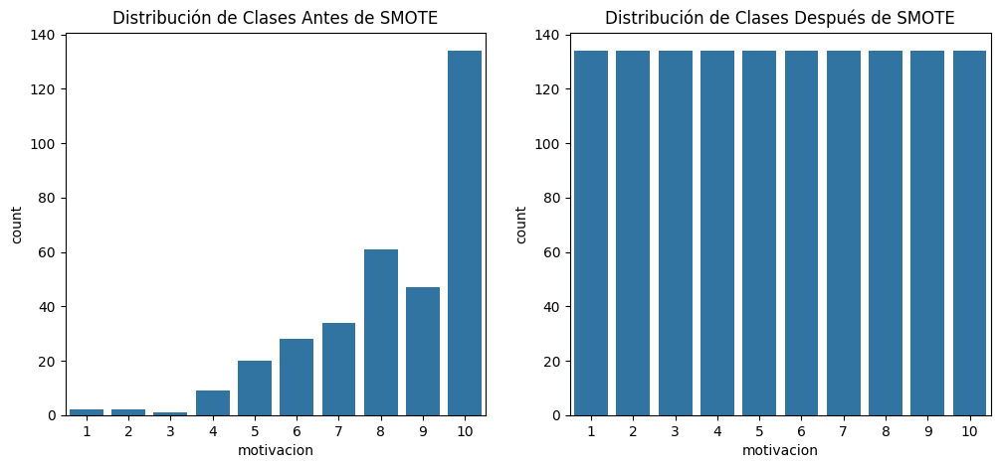

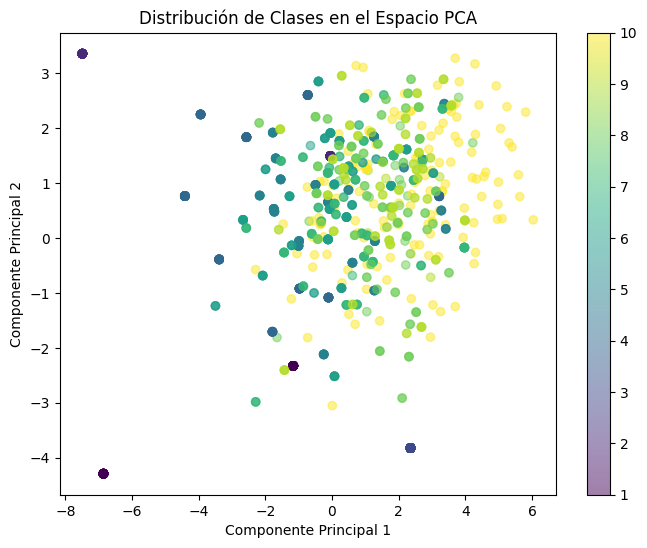

Se han truncado las últimas 5000 líneas del flujo de salida.
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1789, in precision_recall_fscore_support
    labels = _check_set_wise_labels(y_true, y_pred, average, labels, pos_label)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1578, in _check_set_wise_labels
    raise ValueError(
ValueError: Target is multiclass but average='binary'. Please choose another average setting, one of [None, 'micro', 'macro', 'weighted'].

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, 

Mejores parámetros para KNN: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Resultados de KNN:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           5       0.38      0.18      0.24        17
           6       0.11      0.09      0.10        11
           7       0.25      0.25      0.25        16
           8       0.19      0.36      0.25        22
           9       0.27      0.29      0.28        21
          10       0.50      0.40      0.45        52

    accuracy                           0.30       145
   macro avg       0.17      0.16      0.16       145
weighted avg       0.33      0.30      0.30       145



/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 376, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 213, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1293,

Mejores parámetros para SVM: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Resultados de SVM:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           5       0.12      0.12      0.12        17
           6       0.10      0.18      0.13        11
           7       0.13      0.19      0.15        16
           8       0.14      0.18      0.16        22
           9       0.18      0.19      0.19        21
          10       0.55      0.31      0.40        52

    accuracy                           0.21       145
   macro avg       0.12      0.12      0.11       145
weighted avg       0.28      0.21      0.23       145



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

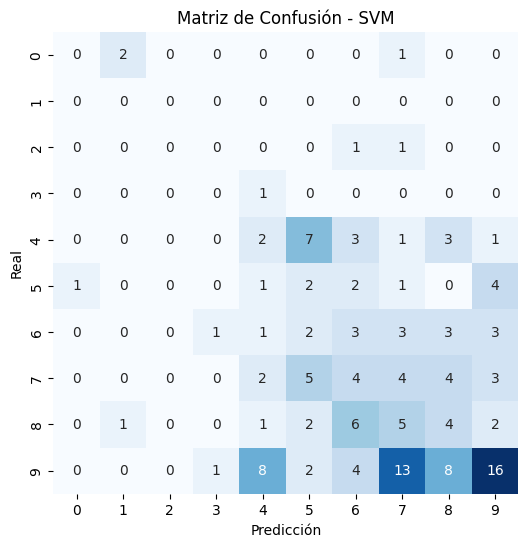

ValueError: multiclass format is not supported

In [ ]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE


# Carga de datos desde archivo (reemplaza 'ruta_datos' por la ruta en tu Colab)
datos = pd.read_excel('DF_final_numerico.xlsx')

# Exploración de datos y limpieza
print("Descripción de los datos:\n", datos.describe())
print("Información de los datos:\n", datos.info())

# Verificación y tratamiento de valores nulos
datos.fillna(datos.mean(), inplace=True)  # Completa con la media de cada columna

# Separación de variables independientes (X) y dependiente (y)
X = datos.drop(columns=['motivacion'])  # Reemplaza 'Deserción' con el nombre de la columna de riesgo de abandono
y = datos['motivacion']

# División del conjunto de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Escalado de características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# **Balanceo de clases con SMOTE**
print("Distribución de clases antes de SMOTE:\n", y_train.value_counts())
# Ajuste de SMOTE para evitar el problema con el número de vecinos
smote = SMOTE(random_state=42, k_neighbors=1)  # Ajusta a 1 o un número menor según sea necesario
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)
print("Distribución de clases después de SMOTE:\n", y_train_bal.value_counts())


# Visualización del balanceo de clases con un gráfico antes y después de SMOTE
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.countplot(x=y_train, ax=axes[0])
axes[0].set_title("Distribución de Clases Antes de SMOTE")
sns.countplot(x=y_train_bal, ax=axes[1])
axes[1].set_title("Distribución de Clases Después de SMOTE")
plt.show()

# **Reducción de dimensionalidad con PCA para visualización**
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_bal)
plt.figure(figsize=(8,6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train_bal, cmap='viridis', alpha=0.5)
plt.title("Distribución de Clases en el Espacio PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.colorbar()
plt.show()

# **Entrenamiento de modelos y búsqueda de hiperparámetros**

# GridSearch para KNN
knn = KNeighborsClassifier()
param_knn = {'n_neighbors': range(1, 15), 'weights': ['uniform', 'distance'], 'metric': ['euclidean', 'manhattan']}
grid_knn = GridSearchCV(knn, param_knn, cv=5, scoring='f1')
grid_knn.fit(X_train_bal, y_train_bal)
print("Mejores parámetros para KNN:", grid_knn.best_params_)
print("Resultados de KNN:\n", classification_report(y_test, grid_knn.predict(X_test)))

# GridSearch para SVM
svm = SVC(probability=True)
param_svm = {'C': [0.1, 1, 10, 100], 'gamma': ['scale', 'auto'], 'kernel': ['linear', 'rbf']}
grid_svm = GridSearchCV(svm, param_svm, cv=5, scoring='f1')
grid_svm.fit(X_train_bal, y_train_bal)
print("Mejores parámetros para SVM:", grid_svm.best_params_)
print("Resultados de SVM:\n", classification_report(y_test, grid_svm.predict(X_test)))

# **Visualización de métricas y desempeño**

# Matriz de confusión y ROC para SVM
y_pred_svm = grid_svm.predict(X_test)
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(6,6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Matriz de Confusión - SVM")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()

# Curva ROC para SVM
y_prob_svm = grid_svm.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob_svm)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC para SVM')
plt.legend(loc="lower right")
plt.show()

# **Bubble Plot en 3D**
from mpl_toolkits.mplot3d import Axes3D

pca_3d = PCA(n_components=3)
X_train_pca_3d = pca_3d.fit_transform(X_train_bal)
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_train_pca_3d[:, 0], X_train_pca_3d[:, 1], X_train_pca_3d[:, 2], c=y_train_bal, cmap='viridis', s=50, alpha=0.6)
ax.set_title("Bubble Plot en 3D - Distribución de Clases (PCA)")
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")
fig.colorbar(scatter, ax=ax)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

In [ ]:
df = pd.read_excel("DF_final_numerico.xlsx")
df.head()

,ID_s,ID2,carrera,promedio_acad,edad,sisben,transporte,semestre,o_voca,e_carrera,...,p_profesores,per_profesores,motivacion,acoso_psc,c_acad,v_semestre,habilidades_pa,adaptacion_u,campus,recomendación_u
0,2,1,0,3.7,28,25,3,4,5,17,...,8,10,10,10,4,8,9,9,9,9
1,2,2,1,3.7,20,27,5,8,5,17,...,6,10,4,10,5,10,10,7,10,10
2,2,3,0,3.7,20,27,4,2,5,17,...,8,8,10,2,2,8,8,8,8,9
3,2,4,0,3.7,20,0,0,5,5,17,...,5,10,10,10,10,5,7,10,10,6
4,2,5,0,3.7,18,2,0,2,5,17,...,5,5,6,8,4,8,6,7,8,6


In [ ]:
df = df.drop(["promedio_acad", "e_acad", "p_cargo", "i_carrera", "carrera", "transporte", "o_voca", "e_negativas", "semestre", "e_carrera", "g_afectacion", "ingresos", "t_estudios", "h_semanal", "a_familiar", "a_profesores", "embarazo_des", "aban_inter", "c_universidad", "m_calificacion", "c_universidad", "m_calificacion", "c_profesores"], axis=1)

In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]
df.head()

,ID_s,ID2,edad,sisben,autopercepcion,razon,r_carrera,m_residencia,financiacion,t_hijos,...,p_profesores,per_profesores,motivacion,acoso_psc,c_acad,v_semestre,habilidades_pa,adaptacion_u,campus,recomendación_u
0,2,1,28,25,0,11,17,19,3,0,...,8,10,10,10,4,8,9,9,9,9
1,2,2,20,27,0,21,17,4,15,0,...,6,10,4,10,5,10,10,7,10,10
2,2,3,20,27,3,21,17,6,0,0,...,8,8,10,2,2,8,8,8,8,9
3,2,4,20,0,3,21,17,18,20,0,...,5,10,10,10,10,5,7,10,10,6
4,2,5,18,2,1,21,8,8,15,0,...,5,5,6,8,4,8,6,7,8,6


In [ ]:
df.shape

(483, 23)

In [ ]:
df.columns

Index(['ID_s', 'ID2', 'edad', 'sisben', 'autopercepcion', 'razon', 'r_carrera',
       'm_residencia', 'financiacion', 't_hijos', 'dificultades_t',
       'c_familiar', 'd_acad', 'p_profesores', 'per_profesores', 'motivacion',
       'acoso_psc', 'c_acad', 'v_semestre', 'habilidades_pa', 'adaptacion_u',
       'campus', 'recomendación_u'],
      dtype='object')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
parametros = {
    'C': [0.01, 0.1],
    'gamma': [1, 0.1],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

In [ ]:
modelo_svm = svm.SVC()

In [ ]:
grid = GridSearchCV(modelo_svm, parametros, refit=True, verbose = 2, cv = 5)

In [ ]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.4s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.1s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.1s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time= 2.7min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time= 1.8min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time= 1.6min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time= 2.4min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time= 1.5min
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.2s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.2s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time= 1.5min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time= 2.0min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time= 1.7min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time= 2.5min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time= 1.4min
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.7s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 2.1min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.7min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.6min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 2.3min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.5min
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.7s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time= 1.5min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time= 1.9min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time= 1.7min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time= 2.5min


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time= 1.4min
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1], 'gamma': [1, 0.1],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             verbose=2)

In [ ]:
grid.best_params_

{'C': 0.01, 'gamma': 1, 'kernel': 'rbf'}

In [ ]:
results = pd.DataFrame(grid.cv_results_)

# Muestras los puntajes de cada modelo
print(results[['params', 'mean_test_score', 'std_test_score']])

                                            params  mean_test_score  \
0      {'C': 0.01, 'gamma': 1, 'kernel': 'linear'}         0.378355   
1         {'C': 0.01, 'gamma': 1, 'kernel': 'rbf'}         0.386014   
2        {'C': 0.01, 'gamma': 1, 'kernel': 'poly'}         0.259041   
3     {'C': 0.01, 'gamma': 1, 'kernel': 'sigmoid'}         0.386014   
4    {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}         0.378355   
5       {'C': 0.01, 'gamma': 0.1, 'kernel': 'rbf'}         0.386014   
6      {'C': 0.01, 'gamma': 0.1, 'kernel': 'poly'}         0.256377   
7   {'C': 0.01, 'gamma': 0.1, 'kernel': 'sigmoid'}         0.386014   
8       {'C': 0.1, 'gamma': 1, 'kernel': 'linear'}         0.349917   
9          {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}         0.386014   
10        {'C': 0.1, 'gamma': 1, 'kernel': 'poly'}         0.259041   
11     {'C': 0.1, 'gamma': 1, 'kernel': 'sigmoid'}         0.386014   
12    {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}         0.349917   
13    

In [ ]:
print(results.columns)

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'param_gamma', 'param_kernel', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score'],
      dtype='object')


In [ ]:
criterios_unicos = results['param_C'].unique()

valores_criterio = {}

for criterio in criterios_unicos:
    df_filtrado = results[results['param_C'] == criterio]

    # Valores máximos de los splits
    valores_maximos = df_filtrado[['mean_test_score']].max()
    valores_criterio[criterio] = valores_maximos

print(valores_criterio)

{0.01: mean_test_score    0.386014
dtype: float64, 0.1: mean_test_score    0.386014
dtype: float64}


# KNN

In [ ]:
parametros = {'n_neighbors': [int(y) for y in range(1,200)],
              'weights': ['uniform','distance'],
              'algorithm': ['auto', 'ball_tree','kd_tree','brute'],
              'p': [1, 2]
              }

In [ ]:
modelo_k = KNeighborsClassifier()

In [ ]:
grid_k = GridSearchCV(modelo_k, parametros, refit=True, verbose = 2, cv = 5)

In [ ]:
grid_k.fit(X_train, y_train)

Fitting 5 folds for each of 3184 candidates, totalling 15920 fits
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.

[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=au

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorit

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neig

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neig

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neig

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_t

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_t

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=d

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             verbose=2)

In [ ]:
# Hacemos predicciones con los datos de prueba
predicciones = grid.predict(X_test)

# Evaluamos el modelo
print("Exactitud:", metrics.accuracy_score(y_test, predicciones))

Exactitud: 0.38144329896907214


In [ ]:
grid_k.best_params_

{'algorithm': 'auto', 'n_neighbors': 33, 'p': 1, 'weights': 'distance'}

In [ ]:
grid_k.best_score_

0.4067599067599067

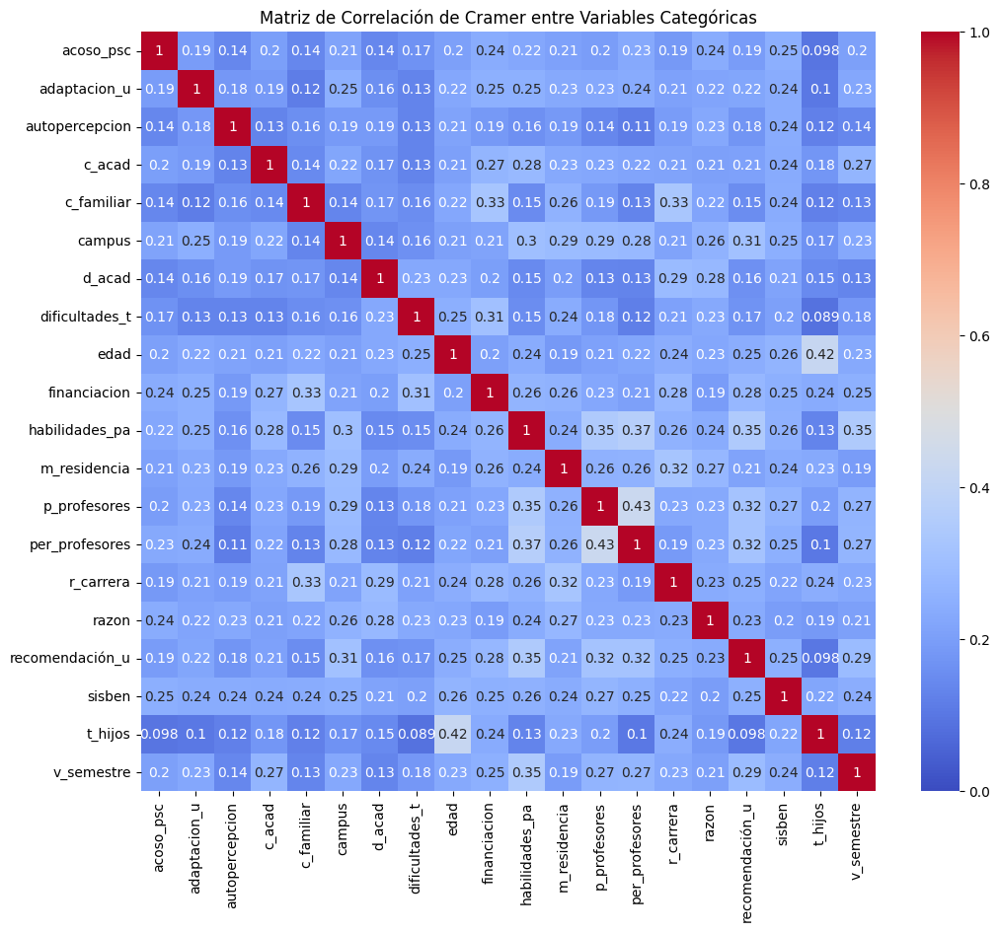

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt


categorical_columns = df.select_dtypes(include=['int', 'object']).columns
categorical_columns = categorical_columns.difference(['ID_s', 'ID2', 'motivacion'])

def cramers_v(confusion_matrix):
    chi2 = stats.chi2_contingency(confusion_matrix, correction=False)[0]
    n = confusion_matrix.sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))

cramers_v_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))),
                                index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df[col1], df[col2])
            if confusion_matrix.shape[0] > 1 and confusion_matrix.shape[1] > 1:
                cramers_v_matrix.loc[col1, col2] = cramers_v(confusion_matrix.values)
            else:
                cramers_v_matrix.loc[col1, col2] = np.nan
        else:
            cramers_v_matrix.loc[col1, col2] = 1.0

plt.figure(figsize=(12, 10))
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.title('Cramers association matrix between Categorical Variables')
plt.show()


# Pruebas

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]
X.head()

,ID_s,ID2,edad,sisben,autopercepcion,razon,r_carrera,m_residencia,financiacion,t_hijos,...,d_acad,p_profesores,per_profesores,acoso_psc,c_acad,v_semestre,habilidades_pa,adaptacion_u,campus,recomendación_u
0,2,1,28,25,0,11,17,19,3,0,...,2,8,10,10,4,8,9,9,9,9
1,2,2,20,27,0,21,17,4,15,0,...,2,6,10,10,5,10,10,7,10,10
2,2,3,20,27,3,21,17,6,0,0,...,1,8,8,2,2,8,8,8,8,9
3,2,4,20,0,3,21,17,18,20,0,...,1,5,10,10,10,5,7,10,10,6
4,2,5,18,2,1,21,8,8,15,0,...,0,5,5,8,4,8,6,7,8,6


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
knn = KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': np.arange(1, 31, 2),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}


In [ ]:
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29]),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [ ]:
print(f"Mejores hiperparámetros: {grid_search.best_params_}")

Mejores hiperparámetros: {'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'distance'}


In [ ]:
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

In [ ]:
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.38620689655172413
[[ 0  0  0  0  0  1  0  1  1]
 [ 0  0  0  0  0  0  2  0  0]
 [ 0  0  0  1  0  0  0  0  0]
 [ 0  0  0  5  3  2  1  2  4]
 [ 0  0  0  1  2  1  1  0  6]
 [ 0  0  0  1  0  0  9  1  5]
 [ 0  0  0  0  2  2 10  0  8]
 [ 0  0  0  0  0  0  8  3 10]
 [ 0  0  0  0  3  1 10  2 36]]
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           5       0.62      0.29      0.40        17
           6       0.20      0.18      0.19        11
           7       0.00      0.00      0.00        16
           8       0.24      0.45      0.32        22
           9       0.33      0.14      0.20        21
          10       0.51      0.69      0.59        52

    accuracy                           0.39       145
   macro avg       0.21      0.20      0.19       145
weighted avg       0.36      0.39      0.35      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

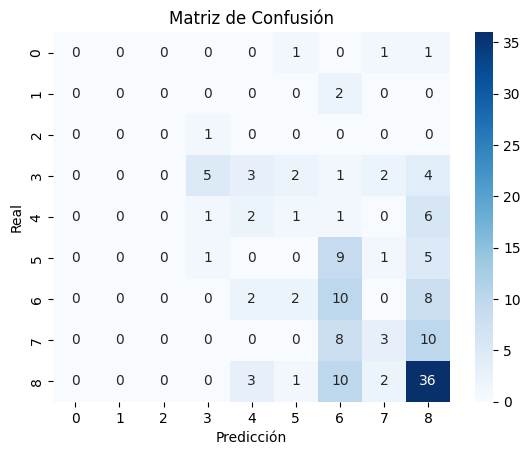

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

# Prueba 2.0


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [ ]:
df.fillna(df.median(), inplace=True)
df = pd.get_dummies(df, drop_first=True)

In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]

In [ ]:
# Ajustar SMOTE con menos vecinos
smote = SMOTE(random_state=42, k_neighbors=1)  # Ajuste a 2 o el número mínimo de muestras en la clase minoritaria menos uno
X_res, y_res = smote.fit_resample(X, y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=42)


In [ ]:
# Escalado de características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': np.arange(1, 51, 2),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev']
}

In [ ]:
pipeline = Pipeline([
    ('pca', PCA(n_components=0.95)),  # Mantener 95% de la varianza
    ('knn', knn)
])

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, {'knn__' + k: v for k, v in param_grid.items()}, cv=cv, scoring='accuracy')
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA(n_components=0.95)),
                                       ('knn', KNeighborsClassifier())]),
             param_grid={'knn__metric': ['euclidean', 'manhattan', 'chebyshev'],
                         'knn__n_neighbors': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49]),
                         'knn__weights': ['uniform', 'distance']},
             scoring='accuracy')

In [ ]:
print(f"Mejores hiperparámetros: {grid_search.best_params_}")
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

Mejores hiperparámetros: {'knn__metric': 'euclidean', 'knn__n_neighbors': 1, 'knn__weights': 'uniform'}


In [ ]:
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.8888888888888888
[[59  0  0  0  0  0  0  0  0  0]
 [ 0 55  0  0  0  0  0  0  0  0]
 [ 0  0 64  0  0  0  0  0  0  0]
 [ 0  0  0 48  0  0  0  0  0  0]
 [ 0  0  0  0 56  2  0  0  1  0]
 [ 0  0  0  0  0 47  0  1  0  1]
 [ 0  0  0  0  0  1 50  1  2  0]
 [ 1  0  1  1  0  1  2 45  0  1]
 [ 0  1  1  1  0  4  1  1 47  1]
 [ 1  0  1  0  1  3  5 11 14 25]]
              precision    recall  f1-score   support

           1       0.97      1.00      0.98        59
           2       0.98      1.00      0.99        55
           3       0.96      1.00      0.98        64
           4       0.96      1.00      0.98        48
           5       0.98      0.95      0.97        59
           6       0.81      0.96      0.88        49
           7       0.86      0.93      0.89        54
           8       0.76      0.87      0.81        52
           9       0.73      0.82      0.78        57
          10       0.89      0.41      0.56        61

    accuracy                           0.89 

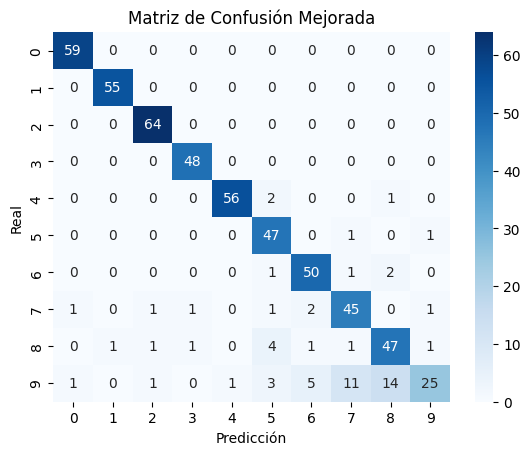

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión Mejorada')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

# Pruebas


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_excel('DF_final_numerico.xlsx')

In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]

In [ ]:
smote = SMOTE(random_state=42, k_neighbors=1)  # Ajuste a 2 o el número mínimo de muestras en la clase minoritaria menos uno
X_res, y_res = smote.fit_resample(X, y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

In [ ]:
pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=10)),
    ('knn', KNeighborsClassifier())
])

pipeline_svm = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=10)),
    ('svm', SVC())
])

In [ ]:
param_grid_knn = {
    'knn__n_neighbors': [3, 5, 7],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

param_grid_svm = {
    'svm__C': [0.1, 1, 10],
    'svm__kernel': ['linear', 'rbf', 'poly'],
    'svm__gamma': ['scale', 'auto']
}

In [ ]:
# 6. Realizar la búsqueda de hiperparámetros
grid_knn = GridSearchCV(pipeline_knn, param_grid_knn, cv=5, scoring='accuracy')
grid_svm = GridSearchCV(pipeline_svm, param_grid_svm, cv=5, scoring='accuracy')

grid_knn.fit(X_train, y_train)
grid_svm.fit(X_train, y_train)

# 7. Obtener los mejores estimadores
best_knn = grid_knn.best_estimator_
best_svm = grid_svm.best_estimator_

# 8. Evaluar el rendimiento en el conjunto de prueba
y_pred_knn = best_knn.predict(X_test)
y_pred_svm = best_svm.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

In [ ]:
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))


print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))

print("Mejores parámetros para KNN:")
print(grid_knn.best_params_)
print("Mejores parámetros para SVM:")
print(grid_svm.best_params_)

KNN Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        35
           2       1.00      1.00      1.00        32
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        27
           5       0.91      0.98      0.94        41
           6       0.88      0.92      0.90        38
           7       0.79      0.90      0.84        41
           8       0.75      0.83      0.79        36
           9       0.71      0.90      0.79        40
          10       0.81      0.31      0.45        42

    accuracy                           0.87       372
   macro avg       0.88      0.88      0.87       372
weighted avg       0.88      0.87      0.86       372

SVM Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        35
           2       1.00      1.00      1.00        32
           3       1.00 

In [ ]:
from sklearn.metrics import accuracy_score

print(f"Accuracy KNN: {accuracy_score(y_test, y_pred_knn)}")
print(f"Accuracy SVM: {accuracy_score(y_test, y_pred_svm)}")

Accuracy KNN: 0.8736559139784946
Accuracy SVM: 0.8655913978494624
